In [1]:
import os
os.environ['HDF5_USE_FILE_LOCKING'] = 'FALSE'

In [2]:
%matplotlib inline

import scanpy as sc
import numpy as np
import pandas as pd
import anndata as ad
import matplotlib.pyplot as plt

# Load data (reference and organoid) and incorporate the new scANVI results

## Load h5ad files

In [22]:
adata_ref = sc.read("/links/groups/treutlein/USERS/zhisong_he/Work/public_datasets/Linnarsson_fetal_human_brain_atlas/preprint_cellranger/braun_2022_fetal_brain_v2_common_hv2k.h5ad")

In [7]:
adata_bo = sc.read("data/phase3_final_0516/ZH_processed.h5ad")

## Run scANVI-based UMAP for reference

In [155]:
sc.pp.neighbors(adata_ref, use_rep='X_scvi')

In [40]:
sc.tl.umap(adata_ref)
adata_ref.obsm['X_umap_scvi'] = adata_ref.obsm['X_umap'].copy()

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


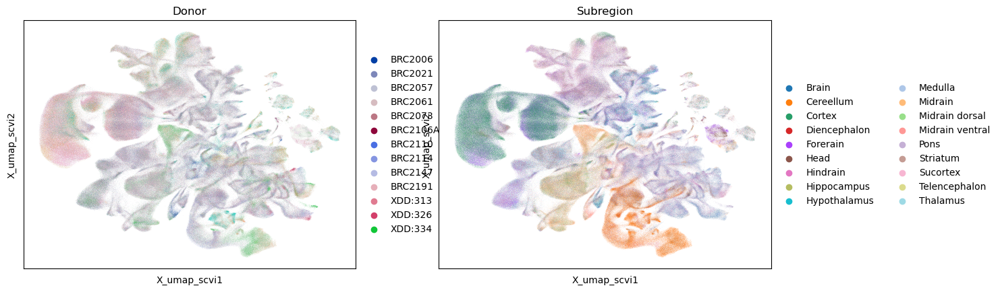

In [41]:
sc.pl.embedding(adata_ref, basis="X_umap_scvi", color = ['Donor','Subregion'])

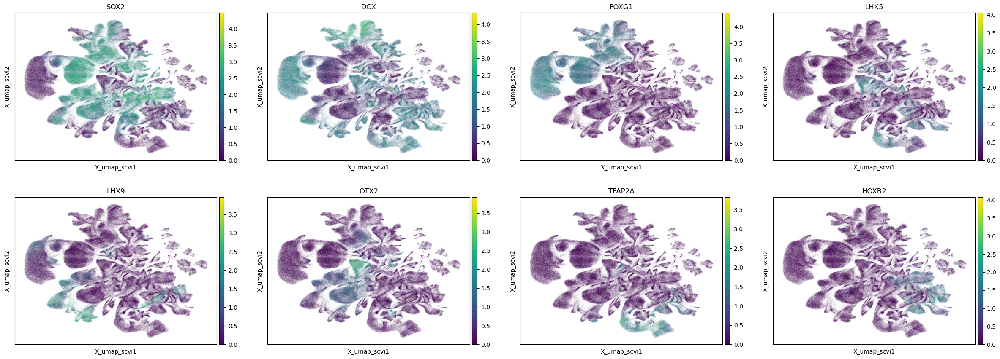

In [85]:
sc.pl.embedding(adata_ref, basis="X_umap_scvi", color = ['SOX2','DCX', 'FOXG1', 'LHX5', 'LHX9', 'OTX2', 'TFAP2A', 'HOXB2'])

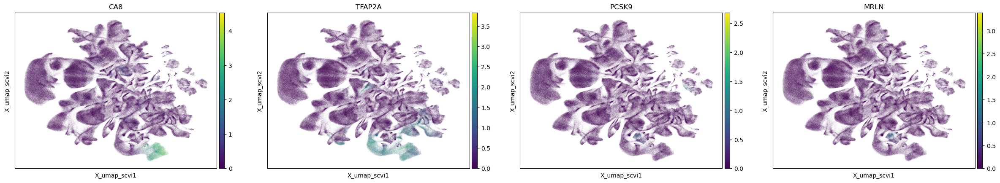

In [86]:
sc.pl.embedding(adata_ref, basis="X_umap_scvi", color = ['CA8','TFAP2A','PCSK9','MRLN'])

In [96]:
sc.tl.leiden(adata_ref, resolution = 1, key_added = 'leiden_scvi_res_1')

In [156]:
sc.tl.leiden(adata_ref, resolution = 2, key_added = 'leiden_scvi_res_2')

In [157]:
sc.tl.leiden(adata_ref, resolution = 10, key_added = 'leiden_scvi_res_10')

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


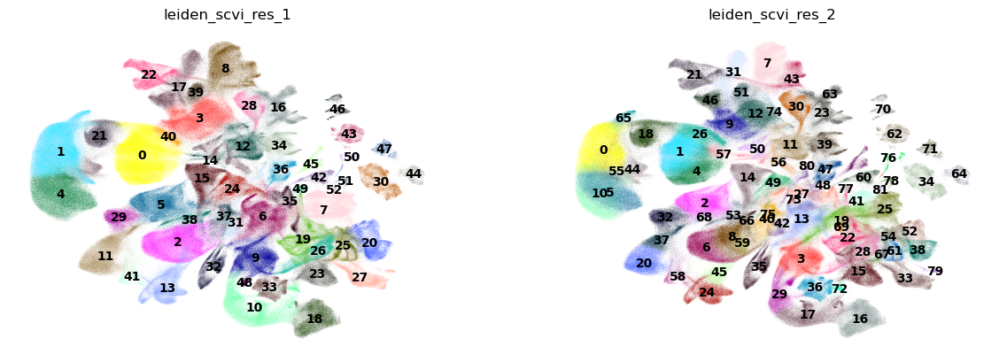

In [151]:
sc.pl.embedding(adata_ref, basis="X_umap_scvi", color = ['leiden_scvi_res_1','leiden_scvi_res_2'],
                frameon = False, legend_loc = 'on data')

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


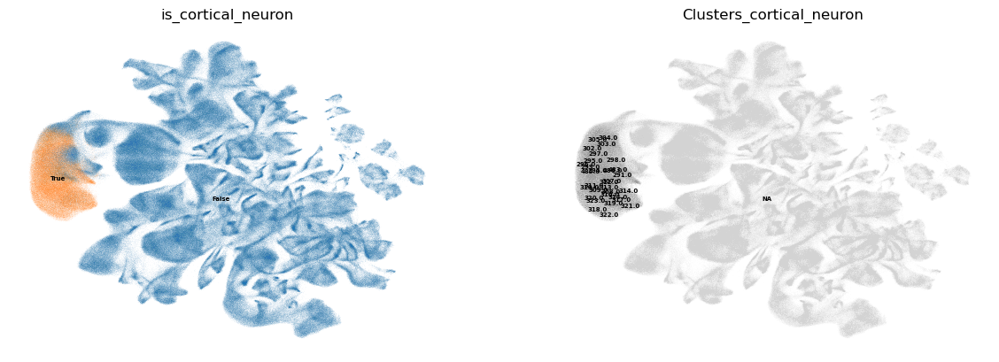

In [243]:
cl_cor_neurons_ref = [305,
 304,
 483,
 295,
 296,
 297,
 303,
 302,
 293,
 298,
 307,
 485,
 486,
 294,
 291,
 313,
 324,
 322,
 323,
 314,
 310,
 312,
 321,
 311,
 309,
 308,
 317,
 319,
 316,
 320,
 318]
adata_ref.obs['is_cortical_neuron'] = np.isin(adata_ref.obs.Clusters, cl_cor_neurons_ref)
adata_ref.obs['Clusters_cortical_neuron'] = adata_ref.obs['Clusters'].copy()
adata_ref.obs.loc[np.logical_not(adata_ref.obs['is_cortical_neuron']),'Clusters_cortical_neuron'] = np.nan
adata_ref.obs['is_cortical_neuron'] = adata_ref.obs['is_cortical_neuron'].astype('category')
adata_ref.obs['Clusters_cortical_neuron'] = adata_ref.obs['Clusters_cortical_neuron'].astype('category')
adata_ref.obs['Clusters_cortical_neuron'] = adata_ref.obs['Clusters_cortical_neuron'].cat.remove_unused_categories()
sc.pl.embedding(adata_ref, basis='X_umap_scvi', color=['is_cortical_neuron','Clusters_cortical_neuron'], frameon=False, legend_loc='on data', legend_fontsize = 5)

# Functions for the knn-based mapping analysis

In [68]:
from pynndescent import NNDescent
from scipy import sparse
from typing import Optional, Union, Mapping, Literal
import warnings

def gaussian_kernel(d, sigma = None):
    if sigma is None:
        sigma = np.max(d) / 3
    gauss = np.exp(-0.5 * np.square(d) / np.square(sigma))
    return gauss

def nn2adj(nn,
           n1 = None,
           n2 = None,
           weight: Literal['unweighted','dist','gaussian_kernel'] = 'unweighted',
           sigma = None
          ):
    if n1 is None:
        n1 = nn[0].shape[0]
    if n2 is None:
        n2 = np.max(nn[0].flatten())
    
    df = pd.DataFrame({'i' : np.repeat(range(nn[0].shape[0]), nn[0].shape[1]),
                       'j' : nn[0].flatten(),
                       'x' : nn[1].flatten()})
    
    if weight == 'unweighted':
        adj = sparse.csr_matrix((np.repeat(1, df.shape[0]), (df['i'], df['j'])), shape=(n1, n2))
    else:
        if weight == 'gaussian_kernel':
            df['x'] = gaussian_kernel(df['x'], sigma)
        adj = sparse.csr_matrix((df['x'], (df['i'], df['j'])), shape=(n1, n2))
    
    return adj

def build_nn(ref,
             query = None,
             k = 100,
             weight: Literal['unweighted','dist','gaussian_kernel'] = 'unweighted',
             sigma = None
            ):
    if query is None:
        query = ref
    
    index = NNDescent(ref)
    knn = index.query(query, k=k)
    adj = nn2adj(knn, n1 = query.shape[0], n2 = ref.shape[0], weight = weight, sigma = sigma)
    return adj

def build_mutual_nn(dat1, dat2 = None, k1 = 100, k2 = None):
    if dat2 is None:
        dat2 = dat1
    if k2 is None:
        k2 = k1
    
    index_1 = NNDescent(dat1)
    index_2 = NNDescent(dat2)
    knn_21 = index_1.query(dat2, k=k1)
    knn_12 = index_2.query(dat1, k=k2)
    adj_21 = nn2adj(knn_21, n1 = dat2.shape[0], n2 = dat1.shape[0])
    adj_12 = nn2adj(knn_12, n1 = dat1.shape[0], n2 = dat2.shape[0])
    
    adj_mnn = adj_12.multiply(adj_21.T)
    return adj_mnn

def get_transition_prob_mat(dat, k = 50, symm = True):
    index = NNDescent(dat)
    knn = index.query(dat, k = k)
    adj = nn2adj(knn, n1 = dat.shape[0], n2 = dat.shape[0])
    if symm:
        adj = ((adj + adj.T) > 0) + 0
    prob = sparse.diags(1 / np.array(adj.sum(1)).flatten()) @ adj.transpose()
    return prob

def random_walk_with_restart(init, transition_prob, alpha = 0.5, num_rounds = 100):
    init = np.array(init).flatten()
    heat = init[:,None]
    for i in range(num_rounds):
        heat = init[:,None] * alpha + (1 - alpha) * (transition_prob.transpose() @ heat)
    return heat

def get_wknn(ref,                                                                                                    # the ref representation to build ref-query neighbor graph
             query,                                                                                                  # the query representation to build ref-query neighbor graph
             ref2 = None,                                                                                            # the ref representation to build ref-ref neighbor graph
             k: int = 100,                                                                                           # number of neighbors per cell
             query2ref: bool = True,                                                                                 # consider query-to-ref neighbors
             ref2query: bool = True,                                                                                 # consider ref-to-query neighbors
             weighting_scheme: Literal['n','top_n','jaccard','jaccard_square','gaussian','dist'] = 'jaccard_square', # how to weight edges in the ref-query neighbor graph
             top_n: Optional[int] = None,
             sigma: Optional[float] = None,
             return_adjs: bool = False
            ):
    adj_q2r = build_nn(ref = ref, query = query, k = k, weight = 'dist' if weighting_scheme in ['gaussian', 'dist'] else 'unweighted')
    
    adj_r2q = None
    if ref2query:
        adj_r2q = build_nn(ref = query, query = ref, k = k, weight = 'dist' if weighting_scheme in ['gaussian', 'dist'] else 'unweighted')
    
    if query2ref and not ref2query:
        adj_knn = adj_q2r.T
    elif ref2query and not query2ref:
        adj_knn = adj_r2q
    elif ref2query and query2ref:
        adj_knn_shared = (adj_r2q > 0).multiply(adj_q2r.T > 0)
        adj_knn = adj_r2q + adj_q2r.T - adj_r2q.multiply(adj_knn_shared)
    else:
        warnings.warn('At least one of query2ref and ref2query should be True. Reset to default with both being True.')
        adj_knn_shared = (adj_r2q > 0).multiply(adj_q2r.T > 0)
        adj_knn = adj_r2q + adj_q2r.T - adj_r2q.multiply(adj_knn_shared)
    
    if weighting_scheme in ['n','top_n','jaccard','jaccard_square']:
        if ref2 is None:
            ref2 = ref
        adj_ref = build_nn(ref = ref2, k=k)
        num_shared_neighbors = adj_q2r @ adj_ref.T
        num_shared_neighbors_nn = num_shared_neighbors.multiply(adj_knn.T)

        wknn = num_shared_neighbors_nn.copy()
        if weighting_scheme == 'top_n':
            if top_n is None:
                top_n = k//4 if k > 4 else 1
            wknn = (wknn > top_n) * 1
        elif weighting_scheme == "jaccard":
            wknn.data = wknn.data / (k+k-wknn.data)
        elif weighting_scheme == "jaccard_square":
            wknn.data = (wknn.data / (k+k-wknn.data)) ** 2
    else:
        wknn = adj_knn.T
        if weighting_scheme == 'gaussian':
            wknn.data = gaussian_kernel(wknn.data, sigma = sigma)
    
    if return_adjs:
        adjs = {'q2r' : adj_q2r,
                'r2q' : adj_r2q,
                'knn' : adj_knn,
                'r2r' : adj_ref}
        return (wknn, adjs)
    else:
        return wknn

# Apply the weighted kNN analysis (jaccard square) to scANVI representations for ref-query linking, and estimate over-/under-representation of primary cell types in organoids

## Based on the query-to-ref neighborhoods, estimate the per-dataset over-/under-representation of primary cell types, and summarize to the atlas

In [61]:
wknn_scanvi_q2r, adjs_scanvi_q2r = get_wknn(ref = adata_ref.obsm['X_scvi'],
                                            query = adata_bo.obsm['X_scanvi_braun2'],
                                            k = 100,
                                            query2ref = True,
                                            ref2query = False,
                                            weighting_scheme = "jaccard_square",
                                            return_adjs = True)

In [62]:
trans_prob_ref = get_transition_prob_mat(adata_ref.obsm['X_scvi'], k=50)

In [104]:
if 'publication_protocol' not in adata_bo.obs.keys():
    adata_bo.obs['publication_protocol'] = [ adata_bo.obs['publication'][i] + ": " + adata_bo.obs['assay_differentiation'][i] for i in range(adata_bo.shape[0]) ]
    adata_bo.obs['publication_protocol'] = adata_bo.obs['publication_protocol'].astype('category')

In [302]:
wknn_scanvi_q2r_per_datasets = [ np.array(wknn_scanvi_q2r[adata_bo.obs.publication_protocol == x,:].sum(axis = 0)).flatten() for x in adata_bo.obs.publication_protocol.cat.categories ]

In [303]:
wknn_scanvi_q2r_per_datasets_sm = [ random_walk_with_restart(init = x, transition_prob = trans_prob_ref, alpha = 0.1) for x in wknn_scanvi_q2r_per_datasets ]

In [304]:
df_wknn_scanvi_q2r = pd.DataFrame(np.concatenate(wknn_scanvi_q2r_per_datasets_sm, axis=1), columns=adata_bo.obs.publication_protocol.cat.categories, index=adata_ref.obs_names)
pd.DataFrame({'name' : np.array(df_wknn_scanvi_q2r.columns)})

,name
0,"Andersen, 2020: Andersen, 2020 (doi: 10.1016/j..."
1,"Andersen, 2020: Andersen, 2020 (doi: 10.1016/j..."
2,"Bhaduri, 2020: Bhaduri, 2020 (doi: 10.1038/s41..."
3,"Bhaduri, 2020: Bhaduri, 2020 (doi: 10.1038/s41..."
4,"Bhaduri, 2020: Velasco, 2019 (doi: 10.1038/s41..."
5,"Birey, 2017: Birey, 2017 (doi: 10.1038/nature2..."
6,"Birey, 2017: Pasca, 2015 (doi: 10.1038/nmeth.3..."
7,"Bowles, 2021: Yoon, 2019 (doi: 10.1038/s41592-..."
8,"Fiorenzano, 2021: Fiorenzano, 2021 (doi: 10.10..."
9,"Fiorenzano, 2021: Fiorenzano, 2021 (doi: 10.10..."


In [305]:
df_wknn_scanvi_q2r_norm = df_wknn_scanvi_q2r.apply(lambda x: np.log1p(x), axis=0).apply(lambda x: np.clip(x, np.percentile(x,1), np.percentile(x,99))).apply(lambda x: (x-np.min(x))/(np.max(x)-np.min(x)))

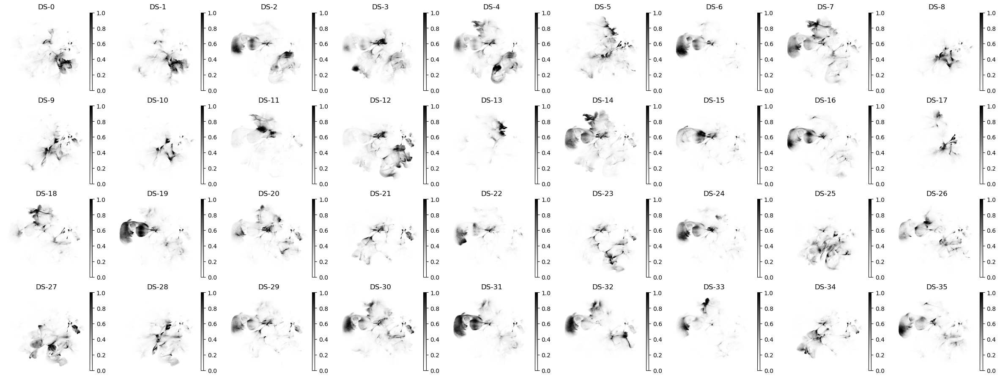

In [94]:
fig, axs = plt.subplots(4, 9, figsize=(30,11))
for i in range(df_wknn_scanvi_q2r_norm.shape[1]):
    idx_row = i // 9
    idx_col = i % 9
    adata_ref.obs['cov_score'] = df_wknn_scanvi_q2r_norm.iloc[:,i]
    sc.pl.embedding(adata_ref, ax=axs[idx_row,idx_col], basis='X_umap_scvi', color = ['cov_score'], color_map = 'Greys', title=["DS-"+str(i)],
                    vmin=0, vmax=1, show=False, frameon=False)
plt.show()

In [ ]:
adata_ref.obs['log_num_wknn_scanvi_q2r_ds_max'] = df_wknn_scanvi_q2r_norm.max(1)

In [91]:
adata_ref.obs['observed'] = (adata_ref.obs['log_num_wknn_scanvi_q2r_ds_max'] > 0.2).astype('category')

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


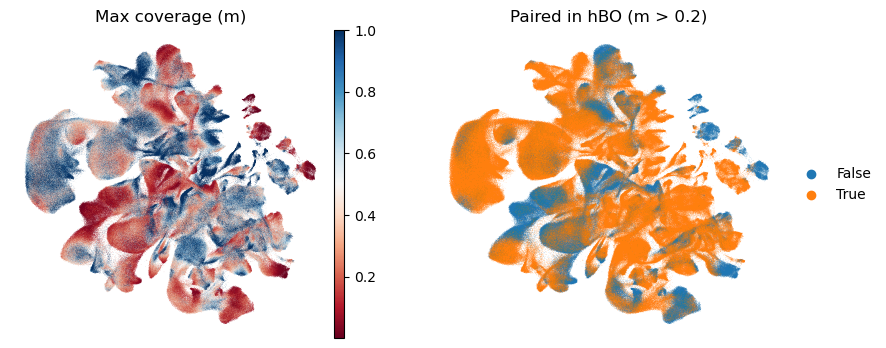

In [93]:
fig, ax = plt.subplots(1,2, figsize = (10,4))
sc.pl.embedding(adata_ref, ax = ax[0], basis='X_umap_scvi', color = ['log_num_wknn_scanvi_q2r_ds_max'], color_map = 'RdBu', title='Max coverage (m)', frameon=False, size=0.2, sort_order=False, show=False)
sc.pl.embedding(adata_ref, ax = ax[1], basis='X_umap_scvi', color = ['observed'], title='Paired in hBO (m > 0.2)', frameon=False, size=0.2, sort_order=False, show=False)
plt.show()

## Summarize cell-level presence scores to cluster level

In [18]:
avg_presence_scores = np.array([ df_wknn_scanvi_q2r_norm.loc[adata_ref.obs.Clusters == cl,:].mean(axis=0) for cl in np.sort(adata_ref.obs.Clusters.unique()) ])
avg_presence_scores.shape

(617, 36)

In [19]:
df_avg_presence_scores = pd.DataFrame(avg_presence_scores).set_index(np.sort(adata_ref.obs.Clusters.unique())).set_axis(df_wknn_scanvi_q2r_norm.columns, axis=1)
df_avg_presence_scores.head()

,"Andersen, 2020: Andersen, 2020 (doi: 10.1016/j.cell.2020.11.017)","Andersen, 2020: Andersen, 2020 (doi: 10.1016/j.cell.2020.11.017); without DAPT","Bhaduri, 2020: Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0); directed","Bhaduri, 2020: Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0); most directed","Bhaduri, 2020: Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)","Birey, 2017: Birey, 2017 (doi: 10.1038/nature22330)","Birey, 2017: Pasca, 2015 (doi: 10.1038/nmeth.3415)","Bowles, 2021: Yoon, 2019 (doi: 10.1038/s41592-018-0255-0)","Fiorenzano, 2021: Fiorenzano, 2021 (doi: 10.1038/s41467-021-27464-5); silk","Fiorenzano, 2021: Fiorenzano, 2021 (doi: 10.1038/s41467-021-27464-5); standard",...,"Sloan, 2017: Pasca, 2015 (doi: 10.1038/nmeth.3415)","Treutlein, 2023: Jo et al., 2016 (doi: 10.1016/j.stem.2016.07.005)","Treutlein, 2023: Qian et al., 2016 (doi: 10.1016/j.cell.2016.04.032)","Trujillo, 2019: Trujillo, 2019 (doi: 10.1016/j.stem.2019.08.002)","Uzquiano, 2022: Quadrato, 2017 (doi: 10.1038/protex.2017.049)","Uzquiano, 2022: Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)","Velasco, 2019: Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)","Vertesy, 2022: Esk, 2020 (doi: 10.1126/science.abb5390)","Xiang, 2019: Xiang, 2019 (doi: 10.1016/j.stem.2018.12.015)","Yoon, 2019: Yoon, 2019 (doi: 10.1038/s41592-018-0255-0)"
0,0.015211,0.029447,0.048975,0.043109,0.068592,0.004585,0.000722,0.003542,0.004504,0.002390,...,0.065250,0.015119,0.008525,0.007320,0.017461,0.035451,0.613508,0.000820,0.003527,0.003372
1,0.012303,0.015992,0.129804,0.062280,0.126274,0.008745,0.001031,0.009404,0.008762,0.005407,...,0.052829,0.050914,0.051724,0.011525,0.038389,0.028259,0.714022,0.003897,0.018499,0.015651
2,0.021248,0.024537,0.276204,0.078043,0.205674,0.013579,0.000864,0.006211,0.010739,0.006203,...,0.098267,0.035577,0.021360,0.018061,0.034960,0.031852,0.320005,0.002763,0.008779,0.012818
3,0.013171,0.011510,0.491450,0.065767,0.295763,0.016337,0.003012,0.011653,0.008536,0.007171,...,0.098234,0.077038,0.056261,0.016892,0.039175,0.035150,0.528860,0.009267,0.032084,0.021947
4,0.014417,0.012966,0.303437,0.082955,0.253115,0.021226,0.005419,0.045042,0.016574,0.018755,...,0.153896,0.207594,0.250099,0.040982,0.172835,0.070872,0.775374,0.021202,0.114767,0.097430


In [33]:
idx_datasets_ordered = [14,11,12,25,30,33,20,15,32,4,31,19,6,16,26,35,29,7,22,2,3,
                        5,18,24,13,34,8,9,10,27,28,23,0,1,21,17]

In [35]:
df_avg_presence_scores = df_avg_presence_scores.iloc[:,idx_datasets_ordered]
df_avg_presence_scores.head()

,"Kanton, 2019: Lancaster, 2014 (doi: 10.1038/nprot.2014.158)","Fleck, 2022: Lancaster, 2014 (doi: 10.1038/nprot.2014.158)","He, 2022: Lancaster, 2014 (doi: 10.1038/nprot.2014.158)","Sawada, 2020: Sawada, 2020 (doi: 10.1038/s41380-020-0844-z)","Uzquiano, 2022: Quadrato, 2017 (doi: 10.1038/protex.2017.049)","Vertesy, 2022: Esk, 2020 (doi: 10.1126/science.abb5390)","Pellegrini, 2020: Pellegrini, 2020 (doi: 10.1126/science.aaz5626); hCO","Kelava, 2022: Pellegrini, 2020 (doi: 10.1126/science.aaz5626); hCO","Velasco, 2019: Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)","Bhaduri, 2020: Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)",...,"Fiorenzano, 2021: Fiorenzano, 2021 (doi: 10.1038/s41467-021-27464-5); silk","Fiorenzano, 2021: Fiorenzano, 2021 (doi: 10.1038/s41467-021-27464-5); standard","Fiorenzano, 2021: Fiorenzano, 2021 (doi:10.1038/s41467-021-27464-5); silk+laminin","Treutlein, 2023: Jo et al., 2016 (doi: 10.1016/j.stem.2016.07.005)","Treutlein, 2023: Qian et al., 2016 (doi: 10.1016/j.cell.2016.04.032)","Quadrato, 2023: Quadrato, 2023 (doi: no_doi)","Andersen, 2020: Andersen, 2020 (doi: 10.1016/j.cell.2020.11.017)","Andersen, 2020: Andersen, 2020 (doi: 10.1016/j.cell.2020.11.017); without DAPT","Pellegrini, 2020: Pellegrini, 2020 (doi: 10.1126/science.aaz5626); hChPO","Marton, 2019: Marton, 2019 (doi: 10.1038/s41593-018-0316-9)"
0,0.002794,0.001540,0.554461,0.005550,0.017461,0.000820,0.022981,0.024084,0.613508,0.068592,...,0.004504,0.002390,0.002956,0.015119,0.008525,0.036072,0.015211,0.029447,0.001200,0.001126
1,0.005540,0.003113,0.527700,0.009513,0.038389,0.003897,0.036334,0.019463,0.714022,0.126274,...,0.008762,0.005407,0.004968,0.050914,0.051724,0.048512,0.012303,0.015992,0.007780,0.005128
2,0.007912,0.007962,0.503582,0.011070,0.034960,0.002763,0.028199,0.012819,0.320005,0.205674,...,0.010739,0.006203,0.005244,0.035577,0.021360,0.084655,0.021248,0.024537,0.006598,0.012434
3,0.009894,0.010767,0.345819,0.010250,0.039175,0.009267,0.031450,0.025086,0.528860,0.295763,...,0.008536,0.007171,0.003914,0.077038,0.056261,0.077699,0.013171,0.011510,0.019770,0.010790
4,0.021263,0.005594,0.481260,0.013904,0.172835,0.021202,0.091956,0.079679,0.775374,0.253115,...,0.016574,0.018755,0.012701,0.207594,0.250099,0.146059,0.014417,0.012966,0.048796,0.006001


In [23]:
df_meta_cl = pd.read_csv('/links/groups/treutlein/USERS/zhisong_he/Work/public_datasets/Linnarsson_fetal_human_brain_atlas/preprint/meta_clusters.tsv', sep='\t')
df_meta_cl.head()

,PoolOrder,PoolCleanOrder,TopLevelOrder,TopLevelCluster,SubCluster,NCells,AutoClass,Class,Subclass,Cycling,...,MeanCellCycleScore,MeanDoubletScore,TopLevelEnriched,SubsetEnriched,PoolEnriched,AutoAnnotation,AutoAnnotationDefs,Location.A.P..Week5.,Location.D.V..Week5.,Germinal.zone..Week5.
0,0,575,276,14,15,2387,Neuron,Neuron,Neuron,NaN,...,0.001869,0.163664,"TFAP2D,LHX9,C1QL4,POU4F1,MAB21L1,OBI1-AS1,EBF2...","NRP2,NWD2,GNG8,MMRN1,CPNE4,CDH8,AC093866.1,CRH...","GNG8,NWD2,CPNE9,POU4F1,OBI1-AS1,SNCG,AC093866....",NEUR | NT-VGLUT2,+INA | +SLC17A6,NaN,NaN,NaN
1,1,--,347,17,8,102,Neuroblast,Failed,Failed,NaN,...,0.001790,0.215119,"HRK,ACTC1,GNG8,NWD2,CPNE9,SHOX2,AL137139.2,COL...","SNCG,NWD2,GPC3,OBI1-AS1,CHRNB3,ONECUT1,PCOLCE2...","NWD2,GNG8,CPNE9,CPNE4,POU4F1,OBI1-AS1,CHRNB3,H...",NBL | NEUR | NT-VGLUT2 | NT-VGLUT3,+NHLH1 | +INA | +SLC17A6 | +SLC17A8,NaN,NaN,NaN
2,2,--,346,17,7,100,Neuroblast,Failed,Failed,NaN,...,0.001800,0.202511,"HRK,ACTC1,GNG8,NWD2,CPNE9,SHOX2,AL137139.2,COL...","GRIP2,SUSD4,AC135782.1,LINC00290,ADAM11,AC0041...","CPNE9,CPNE4,NWD2,HRK,CNTN2,GNG8,AL137139.2,COL...",NBL | NEUR | NT-VGLUT2,+NHLH1 | +INA | +SLC17A6,NaN,NaN,NaN
3,3,--,345,17,6,54,Neuroblast,Failed,Failed,NaN,...,0.003312,0.232875,"HRK,ACTC1,GNG8,NWD2,CPNE9,SHOX2,AL137139.2,COL...","DLX2,DLX6-AS1,FOXG1-AS1,LINC01551,GAD2,FOXG1,D...","GNG8,CPNE9,HRK,CNTN2,AC105450.1,AC093503.2,MDG...",NBL | NEUR | NT-VGLUT2 | NT-VGLUT3,+NHLH1 | +INA | +SLC17A6 | +SLC17A8,NaN,NaN,NaN
4,4,--,344,17,5,107,Neuroblast,Failed,Failed,NaN,...,0.002544,0.173229,"HRK,ACTC1,GNG8,NWD2,CPNE9,SHOX2,AL137139.2,COL...","LINC02759,AC021723.2,LINC01482,CRAT37,TMEM235,...","ACTC1,HRK,GNG8,CNTN2,TESC,TPPP3,SHOX2,MDGA1,AL...",NBL | NEUR | NT-VGLUT2,+NHLH1 | +INA | +SLC17A6,NaN,NaN,NaN


In [24]:
df_meta_cl = df_meta_cl.loc[df_meta_cl['PoolCleanOrder']!='--',['PoolCleanOrder','Class','Subclass','CommonestRegion','CommonestSubregion','CommonestSubdivision']]
df_meta_cl.head()

,PoolCleanOrder,Class,Subclass,CommonestRegion,CommonestSubregion,CommonestSubdivision
0,575,Neuron,Neuron,Diencephalon,Thalamus,Thalamus
10,68,Radial glia,Radial glia,Diencephalon,Thalamus,Thalamus
11,69,Neuronal IPC,Neuronal IPC,Diencephalon,Thalamus,Thalamus
12,70,Neuronal IPC,Neuronal IPC,Diencephalon,Thalamus,Thalamus
13,71,Neuronal IPC,Neuronal IPC,Diencephalon,Thalamus,Thalamus


In [29]:
df_meta_cl.PoolCleanOrder = df_meta_cl.PoolCleanOrder.astype('int')
df_meta_cl = df_meta_cl.set_index('PoolCleanOrder').sort_index()
df_meta_cl.head()

,Class,Subclass,CommonestRegion,CommonestSubregion,CommonestSubdivision
PoolCleanOrder,,,,,
0,Neuroblast,Neuroblast,Medulla,Medulla,Medulla
1,Radial glia,Radial glia,Medulla,Medulla,Medulla
2,Radial glia,Radial glia,Medulla,Medulla,Medulla
3,Glioblast,Glioblast,Medulla,Medulla,Medulla
4,Glioblast,Glioblast,Pons,Pons,Pons


In [36]:
df_meta_cl_plus = pd.concat([df_meta_cl, df_avg_presence_scores], axis=1)
df_meta_cl_plus.head()

,Class,Subclass,CommonestRegion,CommonestSubregion,CommonestSubdivision,"Kanton, 2019: Lancaster, 2014 (doi: 10.1038/nprot.2014.158)","Fleck, 2022: Lancaster, 2014 (doi: 10.1038/nprot.2014.158)","He, 2022: Lancaster, 2014 (doi: 10.1038/nprot.2014.158)","Sawada, 2020: Sawada, 2020 (doi: 10.1038/s41380-020-0844-z)","Uzquiano, 2022: Quadrato, 2017 (doi: 10.1038/protex.2017.049)",...,"Fiorenzano, 2021: Fiorenzano, 2021 (doi: 10.1038/s41467-021-27464-5); silk","Fiorenzano, 2021: Fiorenzano, 2021 (doi: 10.1038/s41467-021-27464-5); standard","Fiorenzano, 2021: Fiorenzano, 2021 (doi:10.1038/s41467-021-27464-5); silk+laminin","Treutlein, 2023: Jo et al., 2016 (doi: 10.1016/j.stem.2016.07.005)","Treutlein, 2023: Qian et al., 2016 (doi: 10.1016/j.cell.2016.04.032)","Quadrato, 2023: Quadrato, 2023 (doi: no_doi)","Andersen, 2020: Andersen, 2020 (doi: 10.1016/j.cell.2020.11.017)","Andersen, 2020: Andersen, 2020 (doi: 10.1016/j.cell.2020.11.017); without DAPT","Pellegrini, 2020: Pellegrini, 2020 (doi: 10.1126/science.aaz5626); hChPO","Marton, 2019: Marton, 2019 (doi: 10.1038/s41593-018-0316-9)"
0,Neuroblast,Neuroblast,Medulla,Medulla,Medulla,0.002794,0.001540,0.554461,0.005550,0.017461,...,0.004504,0.002390,0.002956,0.015119,0.008525,0.036072,0.015211,0.029447,0.001200,0.001126
1,Radial glia,Radial glia,Medulla,Medulla,Medulla,0.005540,0.003113,0.527700,0.009513,0.038389,...,0.008762,0.005407,0.004968,0.050914,0.051724,0.048512,0.012303,0.015992,0.007780,0.005128
2,Radial glia,Radial glia,Medulla,Medulla,Medulla,0.007912,0.007962,0.503582,0.011070,0.034960,...,0.010739,0.006203,0.005244,0.035577,0.021360,0.084655,0.021248,0.024537,0.006598,0.012434
3,Glioblast,Glioblast,Medulla,Medulla,Medulla,0.009894,0.010767,0.345819,0.010250,0.039175,...,0.008536,0.007171,0.003914,0.077038,0.056261,0.077699,0.013171,0.011510,0.019770,0.010790
4,Glioblast,Glioblast,Pons,Pons,Pons,0.021263,0.005594,0.481260,0.013904,0.172835,...,0.016574,0.018755,0.012701,0.207594,0.250099,0.146059,0.014417,0.012966,0.048796,0.006001


## Weighted kNN based label transfer for cell class and region prediction

In [629]:
wknn = wknn_scanvi_q2r

In [133]:
scores_class = pd.DataFrame(wknn @ pd.get_dummies(adata_ref.obs['CellClass']), columns=pd.get_dummies(adata_ref.obs['CellClass']).columns, index=adata_bo.obs_names)
scores_region = pd.DataFrame(wknn @ pd.get_dummies(adata_ref.obs['Subregion']), columns=pd.get_dummies(adata_ref.obs['Subregion']).columns, index=adata_bo.obs_names)
pred_class = scores_class.idxmax(1)
pred_region = scores_region.idxmax(1)

In [134]:
adata_bo.obs['pred_knn_scanvi_class'] = pred_class
adata_bo.obs['pred_knn_scanvi_region'] = pred_region

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


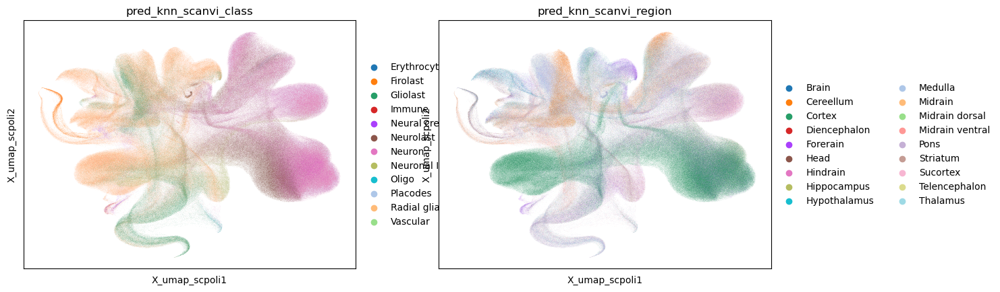

In [135]:
sc.pl.embedding(adata_bo, color=['pred_knn_scanvi_class', 'pred_knn_scanvi_region'], basis="X_umap_scpoli")

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


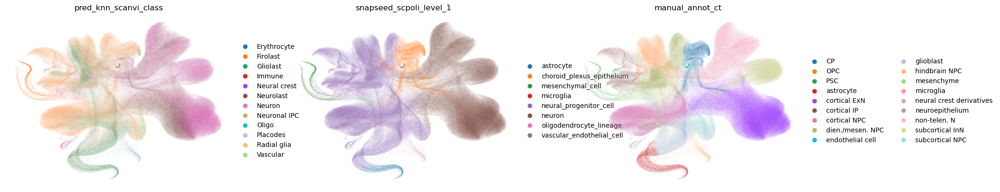

In [136]:
sc.pl.embedding(adata_bo, color=['pred_knn_scanvi_class', 'snapseed_scpoli_level_1', 'manual_annot_ct'], basis="X_umap_scpoli", add_outline=False, frameon = False)

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


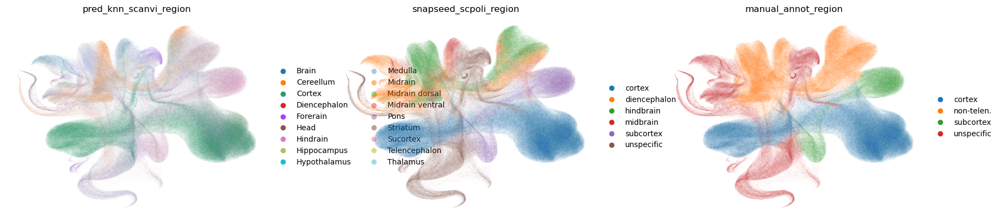

In [137]:
sc.pl.embedding(adata_bo, color=['pred_knn_scanvi_region', 'snapseed_scpoli_region', 'manual_annot_region'], basis="X_umap_scpoli", add_outline=False, frameon = False)

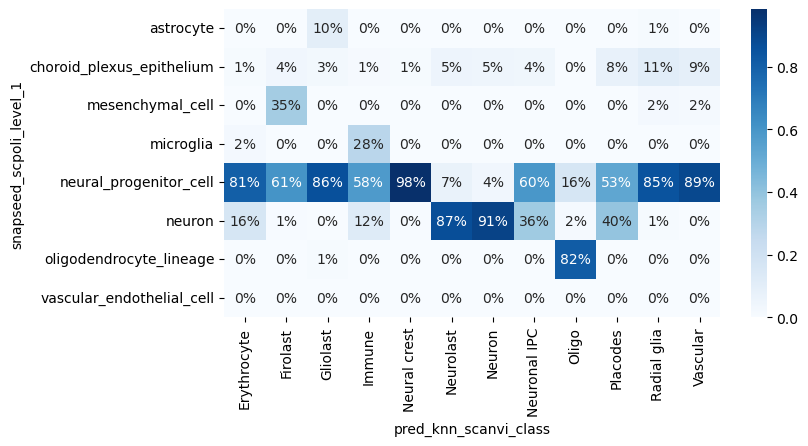

In [256]:
conf_mat = pd.crosstab(adata_bo.obs['snapseed_scpoli_level_1'], adata_bo.obs['pred_knn_scanvi_class'])

import seaborn as sns
from sklearn.preprocessing import scale
mat = conf_mat.apply(lambda x: x/np.sum(x), 0)

from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (8, 4)}):
    sns.heatmap(mat, annot=True, cmap='Blues', fmt='.0%')

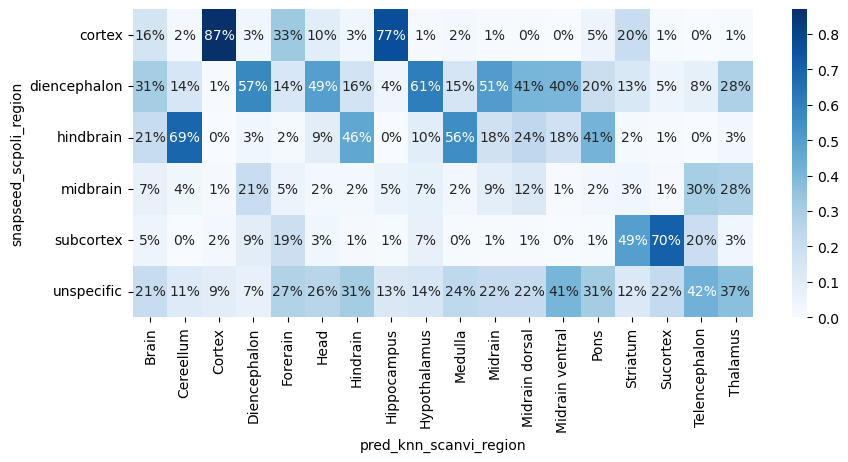

In [258]:
idx = np.isin(adata_bo.obs['snapseed_scpoli_level_1'], ['neural_progenitor_cell','neuron']) | np.isin(adata_bo.obs['pred_knn_scanvi_class'], ['Radial glia','Neurolast','Neuronal IPC','Neuron'])
conf_mat = pd.crosstab(adata_bo.obs['snapseed_scpoli_region'][idx], adata_bo.obs['pred_knn_scanvi_region'][idx])
mat = conf_mat.apply(lambda x: x/np.sum(x), 0)

from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (10, 4)}):
    sns.heatmap(mat, annot=True, cmap='Blues', fmt='.0%')

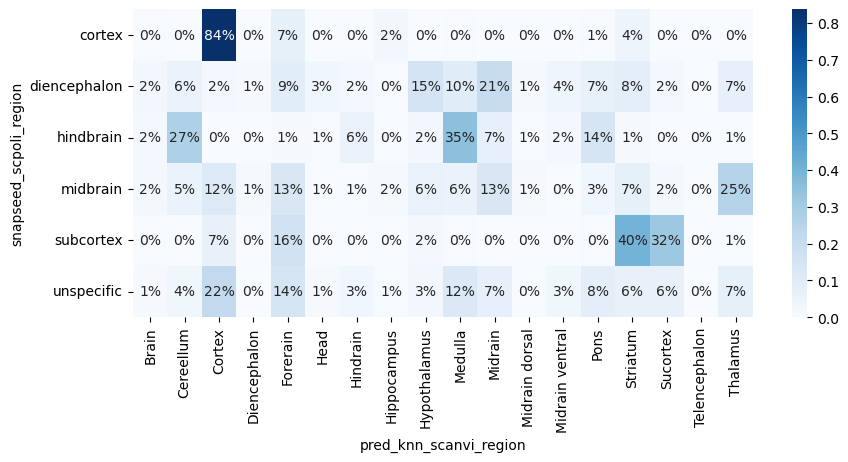

In [259]:
idx = np.isin(adata_bo.obs['snapseed_scpoli_level_1'], ['neural_progenitor_cell','neuron']) | np.isin(adata_bo.obs['pred_knn_scanvi_class'], ['Radial glia','Neurolast','Neuronal IPC','Neuron'])
conf_mat = pd.crosstab(adata_bo.obs['snapseed_scpoli_region'][idx], adata_bo.obs['pred_knn_scanvi_region'][idx])
mat = conf_mat.apply(lambda x: x/np.sum(x), 1)

from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (10, 4)}):
    sns.heatmap(mat, annot=True, cmap='Blues', fmt='.0%')

## Generate the final regional labels for the non-telencephalic NPCs and neurons

In [11]:
wknn = wknn_scanvi_q2r

In [37]:
adata_bo.obs['final_region'] = adata_bo.obs['manual_annot_region'].copy()

In [9]:
pd.get_dummies(adata_ref.obs['Subregion']).columns

CategoricalIndex(['Brain', 'Cereellum', 'Cortex', 'Diencephalon', 'Forerain',
                  'Head', 'Hindrain', 'Hippocampus', 'Hypothalamus', 'Medulla',
                  'Midrain', 'Midrain dorsal', 'Midrain ventral', 'Pons',
                  'Striatum', 'Sucortex', 'Telencephalon', 'Thalamus'],
                 categories=['Brain', 'Cereellum', 'Cortex', 'Diencephalon', ..., 'Striatum', 'Sucortex', 'Telencephalon', 'Thalamus'], ordered=False, dtype='category')

In [20]:
mat_dummy_nontel = pd.get_dummies(adata_ref.obs['Subregion'])[['Hypothalamus','Thalamus','Midrain dorsal','Midrain ventral','Cereellum','Pons','Medulla']]
mat_dummy_nontel.head()

,Hypothalamus,Thalamus,Midrain dorsal,Midrain ventral,Cereellum,Pons,Medulla
CellID,,,,,,,
10X89_1:ACGCCAGTCGATAGAA,0,0,0,0,0,0,0
10X89_1:CTTCTCTAGTCAAGGC,0,0,0,0,0,0,0
10X89_1:GGGCACTAGCGATATA,0,0,0,0,0,0,0
10X89_1:TTCTACAAGGTGTGGT,0,0,0,0,0,0,0
10X89_2:AACACGTAGACTGTAA,0,0,0,0,0,0,0


In [24]:
idx_nontel = np.where(adata_bo.obs['manual_annot_region'] == 'non-telen.')[0]
scores_nontel_region = pd.DataFrame(wknn[idx_nontel,:] @ mat_dummy_nontel, columns=mat_dummy_nontel.columns, index=adata_bo.obs_names[idx_nontel])
scores_nontel_region.head()

,Hypothalamus,Thalamus,Midrain dorsal,Midrain ventral,Cereellum,Pons,Medulla
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_53,0.0,0.0,0.000416,0.0,0.022639,0.027625,0.073897
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_69,0.0,0.0,0.000000,0.0,0.000000,0.240532,0.300274
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_72,0.0,0.0,0.000000,0.0,0.000000,0.737688,0.869987
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_76,0.0,0.0,0.000000,0.0,0.000000,1.082770,0.830746
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_78,0.0,0.0,0.000000,0.0,0.000657,0.012795,0.229020


In [38]:
adata_bo.obs['final_region'] = adata_bo.obs['final_region'].cat.add_categories(scores_nontel_region.columns)
adata_bo.obs['final_region'][idx_nontel] = scores_nontel_region.idxmax(1)
adata_bo.obs['final_region'] = adata_bo.obs['final_region'].cat.remove_unused_categories()
adata_bo.obs['final_region'].value_counts()

cortex             757626
unspecific         369569
subcortex          158506
Medulla            136526
Cereellum           94494
Thalamus            75016
Hypothalamus        70103
Pons                63328
Midrain dorsal      30651
Midrain ventral     14759
Name: final_region, dtype: int64

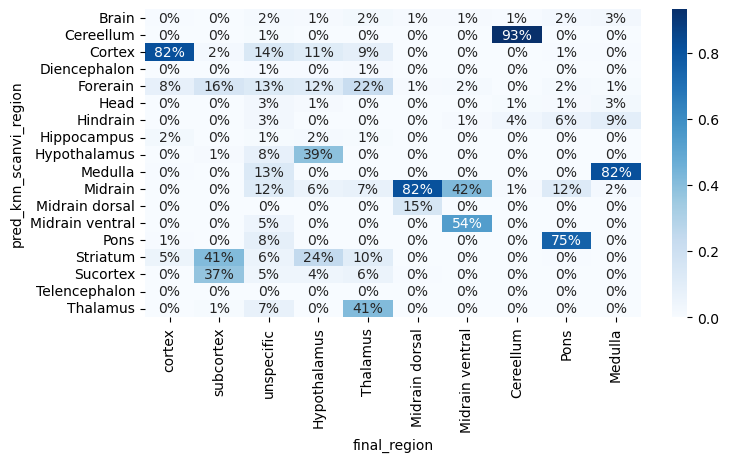

In [39]:
conf_mat = pd.crosstab(adata_bo.obs['pred_knn_scanvi_region'], adata_bo.obs['final_region'])

import seaborn as sns
from sklearn.preprocessing import scale
mat = conf_mat.apply(lambda x: x/np.sum(x), 0)

from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (8, 4)}):
    sns.heatmap(mat, annot=True, cmap='Blues', fmt='.0%')

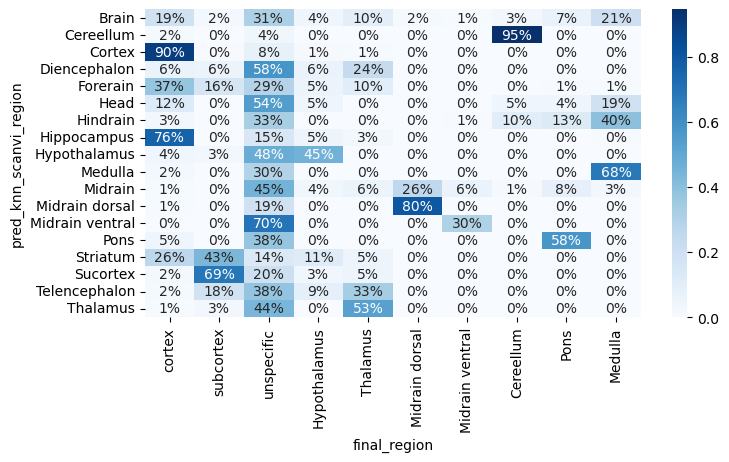

In [52]:
%matplotlib inline

conf_mat = pd.crosstab(adata_bo.obs['pred_knn_scanvi_region'], adata_bo.obs['final_region'])

import seaborn as sns
from sklearn.preprocessing import scale
mat = conf_mat.apply(lambda x: x/np.sum(x), 1)

from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (8, 4)}):
    sns.heatmap(mat, annot=True, cmap='Blues', fmt='.0%')

## Incorporate neuronal subtype information from auto-ref annotation and do label transfer to organoids

### Incorporate the information to the reference data

In [35]:
ntt_annot_ref = pd.read_csv('/links/groups/treutlein/USERS/zhisong_he/Work/public_datasets/Linnarsson_fetal_human_brain_atlas/preprint_cellranger/ntt_annotation.tsv', sep='\t', index_col=0)
ntt_annot_ref.head()

,NT-CHOL,NT-GABA,NT-GLY,NT-SER,NT-VGLUT1,NT-VGLUT2,NT-VGLUT3
CellID,,,,,,,
10X89_1:ACGCCAGTCGATAGAA,False,False,False,False,False,False,False
10X89_1:CTTCTCTAGTCAAGGC,False,False,True,False,False,False,False
10X89_1:GGGCACTAGCGATATA,False,False,False,False,False,False,False
10X89_1:TTCTACAAGGTGTGGT,False,False,False,False,False,False,False
10X89_2:AACACGTAGACTGTAA,False,False,False,False,False,False,False


In [11]:
ntt_annot_ref.shape

(1653974, 7)

In [110]:
np.sum(ntt_annot_ref.index == adata_ref.obs_names)

1653974

In [37]:
ntt_annot_ref_nonredun = ntt_annot_ref.copy()
ntt_annot_ref_nonredun['NT-VGLUT'] = ntt_annot_ref_nonredun[['NT-VGLUT1','NT-VGLUT2','NT-VGLUT3']].sum(1) > 0
ntt_annot_ref_nonredun = ntt_annot_ref_nonredun[np.setdiff1d(ntt_annot_ref_nonredun.columns, ['NT-VGLUT1','NT-VGLUT2','NT-VGLUT3'])]
ntt_annot_ref_nonredun.head()

,NT-CHOL,NT-GABA,NT-GLY,NT-SER,NT-VGLUT
CellID,,,,,
10X89_1:ACGCCAGTCGATAGAA,False,False,False,False,False
10X89_1:CTTCTCTAGTCAAGGC,False,False,True,False,False
10X89_1:GGGCACTAGCGATATA,False,False,False,False,False
10X89_1:TTCTACAAGGTGTGGT,False,False,False,False,False
10X89_2:AACACGTAGACTGTAA,False,False,False,False,False


In [42]:
adata_ref.obs.keys()

Index(['Age', 'CellClass', 'CellCycleFraction', 'CellID', 'Chemistry',
       'Clusters', 'Donor', 'DoubletFlag', 'DoubletScore', 'Region',
       'SampleID', 'Sex', 'Subdivision', 'Subregion', 'Tissue',
       'TopLevelCluster', 'TotalUMIs', 'log_num_wknn_scanvi_q2r', 'cov_score',
       'log_num_wknn_scanvi_q2r_ds_max', 'observed', 'leiden_scvi_res_1',
       'leiden_scvi_res_2', 'leiden_scvi_res_10',
       'log_num_wknn_rss_q2r_ds_max', 'observed_rss', 'leiden_rss_res_1',
       'leiden_rss_res_2', 'leiden_rss_res_10', 'coex_score', 'matching_score',
       'log_num_wknn_scanvi_q2r_hb', 'log_num_wknn_scanvi_q2r_hb_ds_max'],
      dtype='object')

In [115]:
ntt_label_ref = np.array([ " ".join(list(ntt_annot_ref_nonredun.columns[np.where(ntt_annot_ref_nonredun.iloc[i,:])[0]])) for i in range(adata_ref.shape[0]) ])
ntt_label_ref[np.where(np.logical_not(np.isin(adata_ref.obs.CellClass, ['Neuron','Neurolast'])))[0]] = ""
pd.Series(ntt_label_ref).value_counts()

                    909500
NT-VGLUT            373958
NT-GABA             294365
NT-GLY               46469
NT-GABA NT-VGLUT     16231
NT-GLY NT-VGLUT       4929
NT-CHOL               3516
NT-SER                2984
NT-SER NT-VGLUT       2022
dtype: int64

In [129]:
pd.crosstab(adata_ref.obs.CellClass, adata_ref.obs.neuron_ntt_label_only)

neuron_ntt_label_only,,NT-CHOL,NT-GABA,NT-GABA NT-VGLUT,NT-GLY,NT-GLY NT-VGLUT,NT-SER,NT-SER NT-VGLUT,NT-VGLUT
CellClass,,,,,,,,,
Erythrocyte,4636,0,0,0,0,0,0,0,0
Firolast,19080,0,0,0,0,0,0,0,0
Gliolast,131684,0,0,0,0,0,0,0,0
Immune,8101,0,0,0,0,0,0,0,0
Neural crest,868,0,0,0,0,0,0,0,0
Neurolast,65307,3516,30437,5477,14903,0,0,0,164578
Neuron,33196,0,263928,10754,31566,4929,2984,2022,209380
Neuronal IPC,109809,0,0,0,0,0,0,0,0
Oligo,6175,0,0,0,0,0,0,0,0


In [59]:
adata_ref.obs['Subregion2'] = adata_ref.obs.Subregion.cat.rename_categories(['Brain','Cerebellum','Cortex','Diencephalon','Forebrain','Head','Hindbrain','Hippocampus','Hypothalamus','Medulla','Midbrain','Midbrain dorsal','Midbrain ventral','Pons','Striatum','Subcortex','Telencephalon','Thalamus'])
adata_ref.obs['Subregion2'] = adata_ref.obs['Subregion2'].cat.set_categories(['Head','Brain','Forebrain','Telencephalon','Cortex','Subcortex','Striatum','Hippocampus','Diencephalon','Hypothalamus','Thalamus','Midbrain','Midbrain dorsal','Midbrain ventral','Hindbrain','Cerebellum','Pons','Medulla'])

In [123]:
neuron_label_ref = [ adata_ref.obs.Subregion2[i].replace('Cortex','Dorsal Telencephalon').replace('Striatum','Subcortex').replace('Subcortex','Ventral Telencephalon').replace('cephalon','cephalic').replace('halamus','halamic').replace('bellum','bellar').replace('Midbrain ventral','Ventral Midbrain').replace('Midbrain dorsal','Dorsal Midbrain') + " Neuron " + ntt_label_ref[i] if adata_ref.obs.CellClass[i] in ['Neuron','Neurolast'] else "" for i in range(adata_ref.shape[0]) ]
pd.Series(neuron_label_ref).value_counts()

                                                810997
Dorsal Telencephalic Neuron NT-VGLUT             93337
Ventral Telencephalic Neuron NT-GABA             64805
Cerebellar Neuron NT-GABA                        57169
Forebrain Neuron NT-VGLUT                        56071
                                                 ...  
Head Neuron NT-CHOL                                  1
Dorsal Midbrain Neuron NT-SER NT-VGLUT               1
Diencephalic Neuron NT-CHOL                          1
Ventral Midbrain Neuron NT-GABA NT-VGLUT             1
Ventral Telencephalic Neuron NT-SER NT-VGLUT         1
Length: 125, dtype: int64

In [124]:
adata_ref.obs['neuron_ntt_label_only'] = ntt_label_ref
adata_ref.obs['neuron_ntt_label'] = neuron_label_ref

### Direct transfer of neuronal subtype labels

In [12]:
wknn = wknn_scanvi_q2r

In [13]:
scores_nnt = pd.DataFrame(wknn @ ntt_annot_ref, columns=ntt_annot_ref.columns, index=adata_bo.obs_names)

In [14]:
adata_bo.obs['pred_knn_scanvi_nnt'] = scores_nnt.idxmax(1)

In [15]:
freq_annot_nnt = adata_bo.obs[['final_annot','pred_knn_scanvi_nnt']].value_counts().reset_index().sort_values(['final_annot','pred_knn_scanvi_nnt'])
freq_annot_nnt.loc[np.array(freq_annot_nnt.iloc[:,2] > 10000),:]

,final_annot,pred_knn_scanvi_nnt,0
8,Neuroepithelium,NT-CHOL,42828
12,Neuroepithelium,NT-GABA,29015
23,Neuroepithelium,NT-VGLUT2,19002
6,Dorsal Telencephalon NPC,NT-CHOL,43215
2,Dorsal Telencephalon NPC,NT-GABA,159551
27,Dorsal Telencephalon NPC,NT-VGLUT2,16043
29,Dorsal Telencephalon IP,NT-VGLUT2,14039
0,Dorsal Telencephalon Neuron,NT-VGLUT1,338669
1,Dorsal Telencephalon Neuron,NT-VGLUT2,168261
7,Ventral Telencephalon NPC,NT-GABA,42968


In [16]:
meta_ref_cl = pd.read_csv('/links/groups/treutlein/USERS/zhisong_he/Work/public_datasets/Linnarsson_fetal_human_brain_atlas/preprint/meta_clusters.tsv', sep="\t")
meta_ref_cl = meta_ref_cl.loc[meta_ref_cl['PoolCleanOrder']!='--',:].sort_values('PoolCleanOrder')
meta_ref_cl = meta_ref_cl.set_axis(meta_ref_cl['PoolCleanOrder'], axis=0)
meta_ref_cl.head()

,PoolOrder,PoolCleanOrder,TopLevelOrder,TopLevelCluster,SubCluster,NCells,AutoClass,Class,Subclass,Cycling,...,MeanCellCycleScore,MeanDoubletScore,TopLevelEnriched,SubsetEnriched,PoolEnriched,AutoAnnotation,AutoAnnotationDefs,Location.A.P..Week5.,Location.D.V..Week5.,Germinal.zone..Week5.
PoolCleanOrder,,,,,,,,,,,,,,,,,,,,,
0,482,0,349,18,1,1354,Glioblast,Neuroblast,Neuroblast,NaN,...,0.002357,0.094620,"BARHL1,CRABP1,AL359208.1,HOXB3,PRPH,HOXA3,PRDM...","MGP,RERGL,PIK3C2G,PODN,DCT,MLPH,MFAP4,PLCZ1,SO...","MLPH,MGP,ATOH1,MFAP4,RERGL,PIK3C2G,TSHR,PRDM6,...",RGL | GBL | O-HEM | S-CC | S-G2M,+NHLH1,NaN,NaN,NaN
1,483,1,646,36,8,1170,Glioblast,Radial glia,Radial glia,NaN,...,0.003319,0.117696,"PRDM6,ELN,RERGL,GMPR,PIK3C2G,NALCN-AS1,WNT11,A...","DLL3,EYA2,MLPH,PODN,SRRM4,ELAVL4,GRIK3,SLIT1,G...","MFAP4,MLPH,ATOH1,PIK3C2G,RERGL,MGP,PRDM6,PLCZ1...",RGL | GBL | O-HEM | S-CC | S-G1S,+HES1 | +CRYAB +RSPO2,NaN,NaN,NaN
10,495,10,602,33,17,6624,Glioblast,Glioblast,Glioblast,NaN,...,0.007356,0.166769,"TAFA4,AL157944.1,PGM5,PAX7,HS3ST3A1,MECOM,PAX3...","BCAN,AL591686.2,PLD5,AC104389.6,ATP1A2,CYP26B1...","AP001977.1,LINC01956,AP001924.1,HS3ST3A1,AC008...",RGL | GBL | PREAC,+HES1 | +BCAN +TNC | +TOP2A | +TOP2A +UNG,NaN,NaN,NaN
100,536,100,572,32,4,361,Radial glia,Radial glia,Radial glia,NaN,...,0.009535,0.213224,"CYP26A1,KIRREL2,MSX2,PTF1A,RPRML,LINC02306,CCD...","EMX2,FOXG1,LINC01551,FEZF2,LHX2,ARX,FEZF1,MGAT...","VSX1,ANGPT1,LINC02306,PTF1A,FZD10,LINC02739,EF...",RGL | S-CC | S-G1S | S-G2M,+INA | +HES1 | +TOP2A | +TOP2A +UNG,NaN,NaN,NaN
101,535,101,535,30,6,677,Radial glia,Radial glia,Radial glia,NaN,...,0.010095,0.113736,"DLK1,FEZF1,FEZF1-AS1,LINC01833,GPC3,FZD5,AL132...","PAX3,PAX7,HOTAIRM1,TFAP2B,LINC02381,HOXB2,IRX3...","PAX3,LGR5,PAX7,TACSTD2,NDNF,GSX1,LINC02640,AL1...",RGL | S-CC | S-G1S,+HES1 | +TOP2A | +TOP2A +UNG,Failed,NaN,NaN


In [17]:
meta_ref_cl_neuron = meta_ref_cl[meta_ref_cl['Class'].isin(['Neuron','Neuroblast'])]

In [18]:
import re
annot_terms = np.unique(np.concatenate([ np.array(x.split(' | ')) for x in meta_ref_cl_neuron.AutoAnnotation ]))
nt_terms = annot_terms[[re.search(r'^NT-', x) is not None for x in annot_terms]]
nt_terms

array(['NT-CHOL', 'NT-GABA', 'NT-GLY', 'NT-SER', 'NT-VGLUT1', 'NT-VGLUT2',
       'NT-VGLUT3'], dtype='<U9')

In [19]:
has_nt_terms_ref_cl_neuron = np.array([ np.array([ np.sum(np.isin(np.array(x.split(" | ")), term))>0 for x in meta_ref_cl_neuron['AutoAnnotation'] ]) for term in nt_terms ])
has_nt_terms_ref_cl_neuron = pd.DataFrame(np.transpose(has_nt_terms_ref_cl_neuron), index = meta_ref_cl_neuron.index, columns=nt_terms)
has_nt_terms_ref_cl_neuron

,NT-CHOL,NT-GABA,NT-GLY,NT-SER,NT-VGLUT1,NT-VGLUT2,NT-VGLUT3
PoolCleanOrder,,,,,,,
0,False,False,False,False,False,False,False
113,False,False,False,False,False,False,False
116,False,False,False,False,False,False,False
119,False,False,False,False,False,False,True
188,False,True,False,False,False,False,False
...,...,...,...,...,...,...,...
603,False,False,False,False,True,True,False
604,False,False,False,False,False,False,False
605,False,False,False,False,False,False,False


### Try to add restriction: the neuron subtype should exist in the region

In [20]:
adata_ref.obs.Subregion.value_counts()

Cortex             248552
Forerain           210171
Midrain            195520
Cereellum          142005
Medulla            126602
Thalamus           109602
Striatum           107702
Sucortex           101157
Pons                94831
Brain               85996
Hindrain            62666
Hypothalamus        45995
Midrain dorsal      42904
Diencephalon        34563
Midrain ventral     16363
Hippocampus         15560
Telencephalon        7052
Head                 6733
Name: Subregion, dtype: int64

In [21]:
dummy_ref_cl_neuron = pd.get_dummies(meta_ref_cl_neuron['CommonestSubregion'])

In [22]:
dummy_ref_cl_neuron.loc[:,'Brain'] = 1
dummy_ref_cl_neuron.loc[dummy_ref_cl_neuron[['Subcortex','Striatum']].sum(1)>0,'Subcortex'] = 1
dummy_ref_cl_neuron['Telencephalon'] = 0
dummy_ref_cl_neuron.loc[dummy_ref_cl_neuron[['Cortex','Subcortex']].sum(1)>0,'Telencephalon'] = 1
dummy_ref_cl_neuron.loc[dummy_ref_cl_neuron[['Thalamus','Hypothalamus']].sum(1)>0,'Diencephalon'] = 1
dummy_ref_cl_neuron.loc[dummy_ref_cl_neuron[['Telencephalon','Diencephalon']].sum(1)>0,'Forebrain'] = 1
dummy_ref_cl_neuron.loc[dummy_ref_cl_neuron[['Midbrain ventral','Midbrain']].sum(1)>0,'Midbrain'] = 1
dummy_ref_cl_neuron.loc[dummy_ref_cl_neuron[['Cerebellum','Pons','Medulla']].sum(1)>0,'Hindbrain'] = 1
dummy_ref_cl_neuron

/local1/scratch/hezhi/temp/ipykernel_8227/147766361.py:1: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  dummy_ref_cl_neuron.loc[:,'Brain'] = 1


,Brain,Cerebellum,Cortex,Diencephalon,Forebrain,Hindbrain,Hippocampus,Hypothalamus,Medulla,Midbrain,Midbrain ventral,Pons,Striatum,Subcortex,Thalamus,Telencephalon
PoolCleanOrder,,,,,,,,,,,,,,,,
0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0
113,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
116,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
119,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0
188,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
603,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
604,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
605,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [23]:
dummy_ref_cl_neuron.transpose().dot(has_nt_terms_ref_cl_neuron)

,NT-CHOL,NT-GABA,NT-GLY,NT-SER,NT-VGLUT1,NT-VGLUT2,NT-VGLUT3
Brain,1,119,23,2,34,123,6
Cerebellum,0,20,6,0,1,6,1
Cortex,0,3,0,0,21,15,0
Diencephalon,0,24,0,0,0,22,0
Forebrain,0,64,1,0,31,55,1
Hindbrain,1,33,22,1,1,44,5
Hippocampus,0,0,0,0,1,1,0
Hypothalamus,0,8,0,0,0,8,0
Medulla,0,6,9,0,0,17,1
Midbrain,0,20,0,1,0,22,0


In [37]:
has_nt_terms_ref_cl_neuron_nodouble = has_nt_terms_ref_cl_neuron.copy()
has_nt_terms_ref_cl_neuron_nodouble['NT-VGLUT'] = has_nt_terms_ref_cl_neuron_nodouble[['NT-VGLUT1','NT-VGLUT2','NT-VGLUT3']].sum(1) > 0
has_nt_terms_ref_cl_neuron_nodouble = has_nt_terms_ref_cl_neuron_nodouble[np.setdiff1d(has_nt_terms_ref_cl_neuron_nodouble.columns, ['NT-VGLUT1','NT-VGLUT2','NT-VGLUT3'])]
has_nt_terms_ref_cl_neuron_nodouble.loc[has_nt_terms_ref_cl_neuron_nodouble.sum(1)>1,:] = False
has_nt_terms_ref_cl_neuron_nodouble

,NT-CHOL,NT-GABA,NT-GLY,NT-SER,NT-VGLUT
PoolCleanOrder,,,,,
0,False,False,False,False,False
113,False,False,False,False,False
116,False,False,False,False,False
119,False,False,False,False,True
188,False,True,False,False,False
...,...,...,...,...,...
603,False,False,False,False,True
604,False,False,False,False,False
605,False,False,False,False,False


In [39]:
dummy_ref_cl_neuron.transpose().dot(has_nt_terms_ref_cl_neuron_nodouble).loc[['Brain','Forebrain','Telencephalon','Cortex','Subcortex','Striatum','Hippocampus','Diencephalon','Hypothalamus','Thalamus','Midbrain','Midbrain ventral','Hindbrain','Cerebellum','Pons','Medulla'],:]

,NT-CHOL,NT-GABA,NT-GLY,NT-SER,NT-VGLUT
Brain,1,114,22,1,136
Forebrain,0,62,1,0,68
Telencephalon,0,38,1,0,33
Cortex,0,2,0,0,22
Subcortex,0,36,1,0,11
Striatum,0,18,1,0,8
Hippocampus,0,0,0,0,1
Diencephalon,0,23,0,0,21
Hypothalamus,0,8,0,0,8
Thalamus,0,15,0,0,12


### The subregion column contains mixed levels of regions. Harmonize to the finest level for the restriction

In [26]:
freq_ref_cl_subregions = pd.get_dummies(adata_ref.obs.Clusters).transpose().dot(pd.get_dummies(adata_ref.obs.Subregion))
freq_ref_cl_subregions.head()

,Brain,Cereellum,Cortex,Diencephalon,Forerain,Head,Hindrain,Hippocampus,Hypothalamus,Medulla,Midrain,Midrain dorsal,Midrain ventral,Pons,Striatum,Sucortex,Telencephalon,Thalamus
0,0,75,4,0,0,0,52,0,0,188,3,0,0,186,0,0,0,0
1,0,69,6,0,0,0,74,0,0,252,1,0,0,196,0,0,0,0
2,0,24,2,0,0,0,41,0,0,222,0,0,0,218,0,0,0,0
3,0,62,3,0,0,0,56,0,0,79,0,0,0,247,0,0,0,0
4,0,72,9,0,0,0,2,0,0,172,0,0,0,251,0,0,0,0


In [27]:
freq_ref_cl_subregions.shape

(617, 18)

In [33]:
freq_ref_cl_subregions = freq_ref_cl_subregions.set_axis(['Brain','Cerebellum','Cortex','Diencephalon','Forebrain','Head','Hindbrain','Hippocampus','Hypothalamus','Medulla',
                                                          'Midbrain','Midbrain dorsal','Midbrain ventral','Pons','Striatum','Subcortex','Telencephalon','Thalamus'], axis=1)

In [34]:
freq_ref_cl_subregions

,Brain,Cerebellum,Cortex,Diencephalon,Forebrain,Head,Hindbrain,Hippocampus,Hypothalamus,Medulla,Midbrain,Midbrain dorsal,Midbrain ventral,Pons,Striatum,Subcortex,Telencephalon,Thalamus
0,0,75,4,0,0,0,52,0,0,188,3,0,0,186,0,0,0,0
1,0,69,6,0,0,0,74,0,0,252,1,0,0,196,0,0,0,0
2,0,24,2,0,0,0,41,0,0,222,0,0,0,218,0,0,0,0
3,0,62,3,0,0,0,56,0,0,79,0,0,0,247,0,0,0,0
4,0,72,9,0,0,0,2,0,0,172,0,0,0,251,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
612,0,25,10,0,14,0,133,1,46,212,55,31,54,153,3,47,0,3
613,0,18,0,0,6,0,25,0,12,111,37,6,31,215,1,8,0,0
614,0,99,3,0,19,0,11,4,43,35,136,161,207,118,1,96,0,10
615,0,0,154,0,134,0,0,113,17,0,3,1,0,1,2,108,0,10


In [52]:
region_incl = {'Forebrain' : ['Forebrain','Telencephalon','Cortex','Subcortex','Striatum','Hippocampus','Diencephalon','Hypothalamus','Thalamus'],
               'Telencephalon': ['Telencephalon','Cortex','Subcortex','Striatum'],
               'Cortex': ['Cortex'],
               'Subcortex': ['Subcortex','Striatum'],
               'Diencephalon': ['Diencephalon','Thalamus','Hypothalamus'],
               'Hypothalamus': ['Hypothalamus'],
               'Thalamus': ['Thalamus'],
               'Midbrain': ['Midbrain','Midbrain dorsal','Midbrain ventral'],
               'Midbrain dorsal': ['Midbrain dorsal'],
               'Midbrain ventral': ['Midbrain ventral'],
               'Hindbrain': ['Hindbrain','Cerebellum','Pons','Medulla'],
               'Cerebellum': ['Cerebellum'],
               'Pons': ['Pons'],
               'Medulla': ['Medulla']}
region_hier = {'Brain' : ['Forebrain','Midbrain','Hindbrain'],
               'Forebrain' : ['Telencephalon','Diencephalon'],
               'Telencephalon' : ['Cortex','Subcortex'],
               'Diencephalon' : ['Hypothalamus','Thalamus'],
               'Midbrain' : ['Midbrain dorsal','Midbrain ventral'],
               'Hindbrain' : ['Cerebellum','Pons','Medulla']}

In [54]:
freq_ref_cl_hier_regions = pd.concat([ pd.DataFrame(freq_ref_cl_subregions.loc[:,region_incl[x]].sum(1), columns=[x]) for x in region_incl.keys()], axis=1)
freq_ref_cl_hier_regions

,Forebrain,Telencephalon,Cortex,Subcortex,Diencephalon,Hypothalamus,Thalamus,Midbrain,Midbrain dorsal,Midbrain ventral,Hindbrain,Cerebellum,Pons,Medulla
0,4,4,4,0,0,0,0,3,0,0,501,75,186,188
1,6,6,6,0,0,0,0,1,0,0,591,69,196,252
2,2,2,2,0,0,0,0,0,0,0,505,24,218,222
3,3,3,3,0,0,0,0,0,0,0,444,62,247,79
4,9,9,9,0,0,0,0,0,0,0,497,72,251,172
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
612,124,60,10,50,49,46,3,140,31,54,523,25,153,212
613,27,9,0,9,12,12,0,74,6,31,369,18,215,111
614,176,100,3,97,53,43,10,504,161,207,263,99,118,35
615,538,264,154,110,27,17,10,4,1,0,1,0,1,0


In [106]:
def find_commonnest2_recursive(x, hier, start_at, thres_over = 0.5):
    idx_max = x[hier[start_at]].idxmax()
    if idx_max in hier.keys():
        return find_commonnest2_recursive(x, hier, idx_max)
    largest2 = x[hier[start_at]].nlargest(2)
    if largest2.max() - largest2.min() > largest2.min() * thres_over:
        return [idx_max]
    else:
        return list(largest2.index)
comm_2region_ref_cl = freq_ref_cl_hier_regions.apply(lambda x: find_commonnest2_recursive(x, region_hier, 'Brain'), 1)
comm_2region_ref_cl

0                          [Medulla, Pons]
1                          [Medulla, Pons]
2                          [Medulla, Pons]
3                                   [Pons]
4                          [Pons, Medulla]
                      ...                 
612                        [Medulla, Pons]
613                                 [Pons]
614    [Midbrain ventral, Midbrain dorsal]
615                    [Cortex, Subcortex]
616                               [Cortex]
Length: 617, dtype: object

In [107]:
final_subregions = ['Cortex','Subcortex','Hypothalamus','Thalamus','Midbrain dorsal','Midbrain ventral','Cerebellum','Pons','Medulla']
dummy_ref_cl_final_subregions = pd.concat(list(comm_2region_ref_cl.apply(lambda x: pd.DataFrame(np.isin(final_subregions, x)[None,:]).set_axis(final_subregions, axis=1)))).set_index(np.char.mod('%d', comm_2region_ref_cl.index)) * 1
dummy_ref_cl_final_subregions

,Cortex,Subcortex,Hypothalamus,Thalamus,Midbrain dorsal,Midbrain ventral,Cerebellum,Pons,Medulla
0,0,0,0,0,0,0,0,1,1
1,0,0,0,0,0,0,0,1,1
2,0,0,0,0,0,0,0,1,1
3,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...
612,0,0,0,0,0,0,0,1,1
613,0,0,0,0,0,0,0,1,0
614,0,0,0,0,1,1,0,0,0
615,1,1,0,0,0,0,0,0,0


In [109]:
freq_ref_neuron_subtypes_subregions = dummy_ref_cl_final_subregions.loc[has_nt_terms_ref_cl_neuron_nodouble.index,:].transpose().dot(has_nt_terms_ref_cl_neuron_nodouble)
constraint_neuron_subtypes_subregions = freq_ref_neuron_subtypes_subregions > 0
constraint_neuron_subtypes_subregions

,NT-CHOL,NT-GABA,NT-GLY,NT-SER,NT-VGLUT
Cortex,False,True,True,False,True
Subcortex,False,True,False,False,True
Hypothalamus,False,True,False,False,True
Thalamus,False,True,False,False,True
Midbrain dorsal,False,True,False,False,True
Midbrain ventral,False,True,True,False,True
Cerebellum,False,True,True,False,True
Pons,True,True,True,True,True
Medulla,True,True,True,True,True


In [112]:
ntt_annot_ref_nonredun = ntt_annot_ref.copy()
ntt_annot_ref_nonredun['NT-VGLUT'] = ntt_annot_ref_nonredun[['NT-VGLUT1','NT-VGLUT2','NT-VGLUT3']].sum(1) > 0
ntt_annot_ref_nonredun = ntt_annot_ref_nonredun[np.setdiff1d(ntt_annot_ref_nonredun.columns, ['NT-VGLUT1','NT-VGLUT2','NT-VGLUT3'])]
ntt_annot_ref_nonredun.loc[ntt_annot_ref_nonredun.sum(1)>1,:] = False
ntt_annot_ref_nonredun

,NT-CHOL,NT-GABA,NT-GLY,NT-SER,NT-VGLUT
CellID,,,,,
10X89_1:ACGCCAGTCGATAGAA,False,False,False,False,False
10X89_1:CTTCTCTAGTCAAGGC,False,False,True,False,False
10X89_1:GGGCACTAGCGATATA,False,False,False,False,False
10X89_1:TTCTACAAGGTGTGGT,False,False,False,False,False
10X89_2:AACACGTAGACTGTAA,False,False,False,False,False
...,...,...,...,...,...
10X302_7:AGAGAATAGAGGATCC,False,False,False,False,False
10X302_8:AAGCCATTCCACCTCA,False,False,False,False,False
10X302_8:ACGGTTAGTTAGGCCC,False,False,False,False,False


In [113]:
scores_nnt_nonredun = pd.DataFrame(wknn @ ntt_annot_ref_nonredun, columns=ntt_annot_ref_nonredun.columns, index=adata_bo.obs_names)
scores_nnt_nonredun

,NT-CHOL,NT-GABA,NT-GLY,NT-SER,NT-VGLUT
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_53,0.0,0.000957,0.000000,0.000000,0.000000
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_69,0.0,0.046967,0.000000,0.000000,0.000000
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_72,0.0,1.020361,0.344466,0.071023,0.199613
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_76,0.0,0.000000,0.000000,0.000000,0.000000
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_78,0.0,0.016537,0.000000,0.000000,0.000000
...,...,...,...,...,...
homosapiens_cerebralcortex_2017_smartseq2_sloansteven_001_d10_1016_j_neuron_2017_07_035_706,0.0,0.083906,0.000000,0.000000,0.000000
homosapiens_cerebralcortex_2017_smartseq2_sloansteven_001_d10_1016_j_neuron_2017_07_035_707,0.0,0.211433,0.000000,0.000000,0.000000
homosapiens_cerebralcortex_2017_smartseq2_sloansteven_001_d10_1016_j_neuron_2017_07_035_708,0.0,0.004074,0.000000,0.000000,0.024358
homosapiens_cerebralcortex_2017_smartseq2_sloansteven_001_d10_1016_j_neuron_2017_07_035_709,0.0,0.023206,0.000000,0.000000,0.004074


In [131]:
nnt_bo = pd.DataFrame(np.repeat("", adata_bo.shape[0]), columns = ['NT']).set_index(adata_bo.obs_names)
nnt_bo.loc[adata_bo.obs.final_annot=='Dorsal Telencephalon Neuron','NT'] = 'NT-VGLUT'
nnt_bo.loc[adata_bo.obs.final_annot=='Ventral Telencephalon Neuron','NT'] = 'NT-GABA'
nnt_bo.loc[adata_bo.obs.final_annot=='Hypothalamus Neuron','NT'] = scores_nnt_nonredun.loc[adata_bo.obs.final_annot=='Hypothalamus Neuron',constraint_neuron_subtypes_subregions.loc['Hypothalamus',:]].idxmax(1)
nnt_bo.loc[adata_bo.obs.final_annot=='Thalamus Neuron','NT'] = scores_nnt_nonredun.loc[adata_bo.obs.final_annot=='Thalamus Neuron',constraint_neuron_subtypes_subregions.loc['Thalamus',:]].idxmax(1)
nnt_bo.loc[adata_bo.obs.final_annot=='Dorsal Midbrain Neuron','NT'] = scores_nnt_nonredun.loc[adata_bo.obs.final_annot=='Dorsal Midbrain Neuron',constraint_neuron_subtypes_subregions.loc['Midbrain dorsal',:]].idxmax(1)
nnt_bo.loc[adata_bo.obs.final_annot=='Ventral Midbrain Neuron','NT'] = scores_nnt_nonredun.loc[adata_bo.obs.final_annot=='Ventral Midbrain Neuron',constraint_neuron_subtypes_subregions.loc['Midbrain ventral',:]].idxmax(1)
nnt_bo.loc[adata_bo.obs.final_annot=='Cerebellum Neuron','NT'] = scores_nnt_nonredun.loc[adata_bo.obs.final_annot=='Cerebellum Neuron',constraint_neuron_subtypes_subregions.loc['Cerebellum',:]].idxmax(1)
nnt_bo.loc[adata_bo.obs.final_annot=='Pons Neuron','NT'] = scores_nnt_nonredun.loc[adata_bo.obs.final_annot=='Pons Neuron',constraint_neuron_subtypes_subregions.loc['Pons',:]].idxmax(1)
nnt_bo.loc[adata_bo.obs.final_annot=='Medulla Neuron','NT'] = scores_nnt_nonredun.loc[adata_bo.obs.final_annot=='Medulla Neuron',constraint_neuron_subtypes_subregions.loc['Medulla',:]].idxmax(1)

In [133]:
adata_bo.obs['final_nnt'] = nnt_bo
adata_bo.obs['final_annot_nnt'] = [adata_bo.obs['final_annot'][i] + " " + adata_bo.obs['final_nnt'][i] if adata_bo.obs['final_nnt'][i] != "" else adata_bo.obs['final_annot'][i] for i in range(adata_bo.shape[0])]

In [143]:
adata_bo.obs['final_annot_nnt'] = adata_bo.obs['final_annot_nnt'].astype('category').cat.set_categories(['PSC','Neuroepithelium','Dorsal Telencephalon NPC','Dorsal Telencephalon IP','Dorsal Telencephalon Neuron NT-VGLUT',
                                                                                                         'Ventral Telencephalon NPC','Ventral Telencephalon Neuron NT-GABA','Hypothalamus NPC','Hypothalamus Neuron NT-VGLUT','Hypothalamus Neuron NT-GABA',
                                                                                                         'Thalamus NPC','Thalamus Neuron NT-VGLUT','Thalamus Neuron NT-GABA','Dorsal Midbrain NPC','Dorsal Midbrain Neuron NT-VGLUT','Dorsal Midbrain Neuron NT-GABA',
                                                                                                         'Ventral Midbrain NPC','Ventral Midbrain Neuron NT-VGLUT','Ventral Midbrain Neuron NT-GABA','Ventral Midbrain Neuron NT-GLY',
                                                                                                         'Cerebellum NPC','Cerebellum Neuron NT-VGLUT','Cerebellum Neuron NT-GABA','Cerebellum Neuron NT-GLY',
                                                                                                         'Pons NPC','Pons Neuron NT-VGLUT','Pons Neuron NT-GABA','Pons Neuron NT-GLY','Pons Neuron NT-CHOL','Pons Neuron NT-SER',
                                                                                                         'Medulla NPC','Medulla Neuron NT-VGLUT','Medulla Neuron NT-GABA','Medulla Neuron NT-GLY','Medulla Neuron NT-CHOL','Medulla Neuron NT-SER',
                                                                                                         'Glioblast','Astrocyte','OPC','CP','NC Derivatives','Microglia','EC','MC'])
adata_bo.obs['final_annot_nnt'].value_counts(sort=False)

PSC                                       2187
Neuroepithelium                          91689
Dorsal Telencephalon NPC                224111
Dorsal Telencephalon IP                  15433
Dorsal Telencephalon Neuron NT-VGLUT    518082
Ventral Telencephalon NPC                46500
Ventral Telencephalon Neuron NT-GABA    112006
Hypothalamus NPC                         20290
Hypothalamus Neuron NT-VGLUT             24701
Hypothalamus Neuron NT-GABA              25112
Thalamus NPC                             40158
Thalamus Neuron NT-VGLUT                 27184
Thalamus Neuron NT-GABA                   7674
Dorsal Midbrain NPC                      17928
Dorsal Midbrain Neuron NT-VGLUT           8511
Dorsal Midbrain Neuron NT-GABA            4212
Ventral Midbrain NPC                      8924
Ventral Midbrain Neuron NT-VGLUT          4010
Ventral Midbrain Neuron NT-GABA           1562
Ventral Midbrain Neuron NT-GLY             263
Cerebellum NPC                           55673
Cerebellum Ne

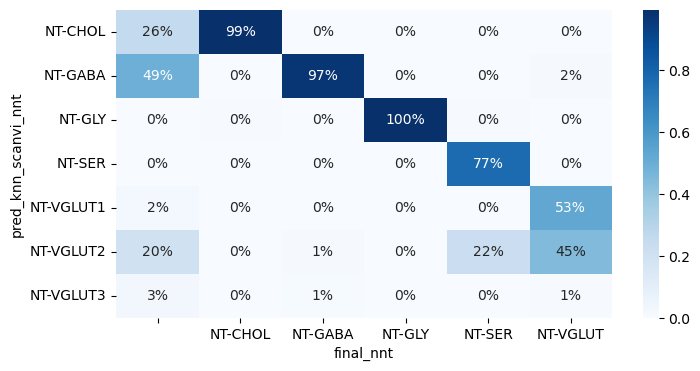

In [145]:
conf_mat = pd.crosstab(adata_bo.obs['pred_knn_scanvi_nnt'], adata_bo.obs['final_nnt'])

import seaborn as sns
from sklearn.preprocessing import scale
mat = conf_mat.apply(lambda x: x/np.sum(x), 0)

from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (8, 4)}):
    sns.heatmap(mat, annot=True, cmap='Blues', fmt='.0%')

### Refine annotation column names and add the figure 1 annotation

In [18]:
adata_bo.obs['annot_level_1'] = adata_bo.obs['final_class'].cat.rename_categories(['PSC','Neuroepithelium','NPC','IP','Neuron','Glioblast','Astrocyte','OPC','CP','Microglia','NC Derivatives','EC','MC'])
new_level2_names = dict(zip(adata_bo.obs['manual_annot_ct'].cat.categories,
                            ['CP','OPC','PSC','Astrocyte',
                             'Dorsal Telencephalic Neuron','Dorsal Telencephalic IP','Dorsal Telencephalic NPC',
                             'Non-telencephalic NPC','EC','Glioblast',
                             'Non-telencephalic NPC','MC','Microglia','NC Derivatives',
                             'Neuroepithelium','Non-telencephalic Neuron','Ventral Telencephalic Neuron','Ventral Telencephalic NPC']))
adata_bo.obs['annot_level_2'] = adata_bo.obs['manual_annot_ct'].map(new_level2_names).astype("category")
adata_bo.obs['annot_level_2'] = adata_bo.obs['annot_level_2'].cat.set_categories(['PSC','Neuroepithelium',
                                                                                  'Dorsal Telencephalic NPC','Ventral Telencephalic NPC','Non-telencephalic NPC','Dorsal Telencephalic IP',
                                                                                  'Dorsal Telencephalic Neuron','Ventral Telencephalic Neuron','Non-telencephalic Neuron',
                                                                                  'Glioblast','Astrocyte','OPC','CP','Microglia','NC Derivatives','EC','MC'])

In [25]:
new_level3_names = dict(zip(adata_bo.obs['final_annot'].cat.categories,
                            [x.replace('cephalon','cephalic').replace('halamus','halamic').replace('bellum','bellar') for x in adata_bo.obs['final_annot'].cat.categories]))
adata_bo.obs['annot_level_3'] = adata_bo.obs['final_annot'].map(new_level3_names).astype("category")
new_level4_names = dict(zip(adata_bo.obs['final_annot_nnt'].cat.categories,
                            [x.replace('cephalon','cephalic').replace('halamus','halamic').replace('bellum','bellar') for x in adata_bo.obs['final_annot_nnt'].cat.categories]))
adata_bo.obs['annot_level_4'] = adata_bo.obs['final_annot_nnt'].map(new_level4_names).astype("category")

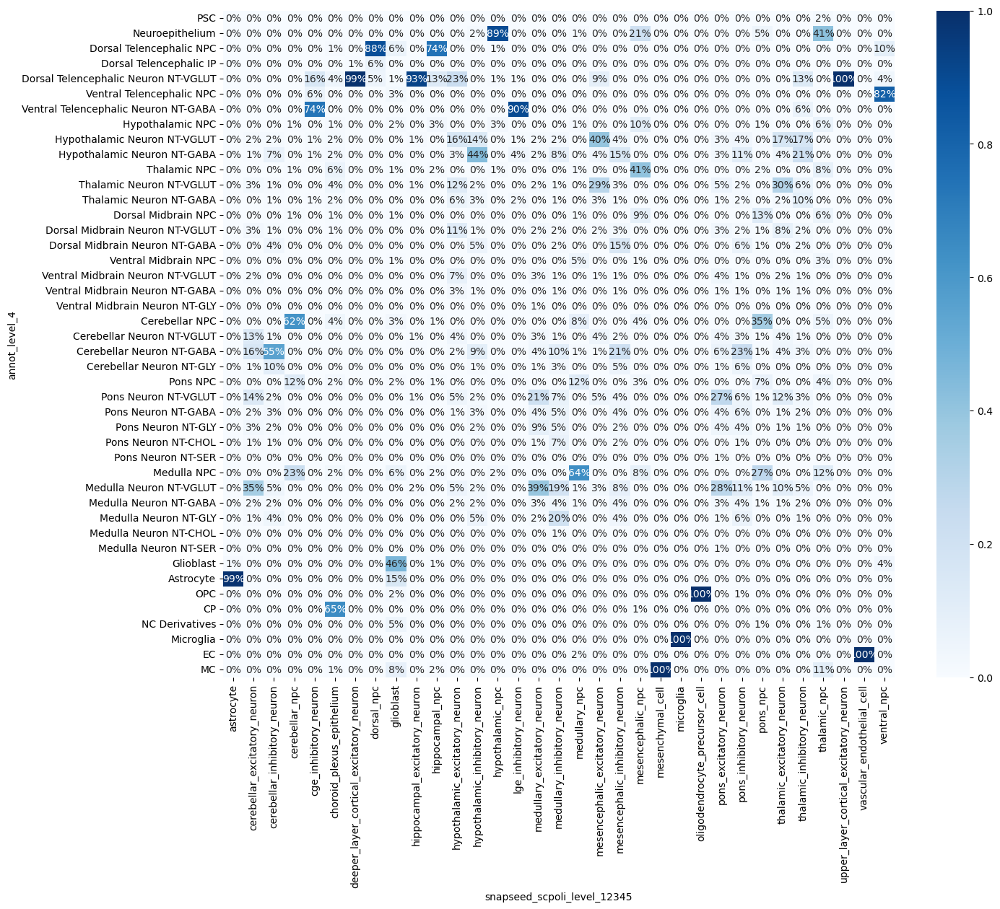

In [29]:
conf_mat = pd.crosstab(adata_bo.obs['annot_level_4'], adata_bo.obs['snapseed_scpoli_level_12345'])

import seaborn as sns
from sklearn.preprocessing import scale
mat = conf_mat.apply(lambda x: x/np.sum(x), 0)

from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (15, 12)}):
    sns.heatmap(mat, annot=True, cmap='Blues', fmt='.0%')

# For revision: Double check the scANVI-wkNN transferred regional labels

## Load the data and wkNN

In [4]:
adata_bo = sc.read_h5ad('data/phase3_final_0516/ZH_processed_cleanup.h5ad')

In [115]:
adata_bo.obsm.keys()

KeysView(AxisArrays with keys: X_pca_rss, X_pca_unintegrated, X_rss, X_scanvi_braun2, X_scpoli, X_scpoli_aggr_1, X_scpoli_aggr_123, X_umap, X_umap_pca_rss, X_umap_pca_unintegrated, X_umap_scanvi_braun2, X_umap_scpoli, X_umap_scpoli_aggr_1, X_umap_scpoli_aggr_123)

In [5]:
adata_ref = sc.read_h5ad('ext/models_Braun/braun_2022_fetal_brain_v2_cleanedup.h5ad')

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [8]:
adata_ref.var_names_make_unique()

In [9]:
adata_ref.obs.columns

Index(['CellID', 'SampleID', 'Chemistry', 'Donor', 'Sex', 'Age', 'Region',
       'Subregion', 'Subdivision', 'Tissue', 'SummarizedRegion',
       'TopLevelCluster', 'Cluster', 'CellClass', 'IsNeural',
       'NeurotransmitterTransporter', 'CellType', 'CellCycleFraction',
       'DoubletScore', 'DoubletFlag', 'PresenceScoreOverall_HNOCA',
       'PresenceScoreMax_HNOCA', 'louvain_scvi_res2', 'louvain_scvi_res20'],
      dtype='object')

In [7]:
import pickle
with open('analysis/phase_3_final_0516/outputs/Braun/wknn_q2r_Braun2_scANVI.pickle', 'rb') as file:
    wknn_scanvi_q2r = pickle.load(file)

## Hierarchical regional label assignment

In [57]:
import sys
sys.path.append('ext/')
import codes.py_util as util
import codes.py_wknn as wknn
import codes.scarches_label_transfer as sclt

In [121]:
region_incl = {'Forebrain' : ['Forebrain','Telencephalon','Cortex','Subcortex','Striatum','Hippocampus','Diencephalon','Hypothalamus','Thalamus'],
               'Telencephalon': ['Telencephalon','Cortex','Subcortex','Striatum'],
               'Cortex': ['Cortex'],
               'Subcortex': ['Subcortex','Striatum'],
               'Diencephalon': ['Diencephalon','Thalamus','Hypothalamus'],
               'Hypothalamus': ['Hypothalamus'],
               'Thalamus': ['Thalamus'],
               'Midbrain': ['Midbrain','Midbrain dorsal','Midbrain ventral'],
               'Midbrain dorsal': ['Midbrain dorsal'],
               'Midbrain ventral': ['Midbrain ventral'],
               'Hindbrain': ['Hindbrain','Cerebellum','Pons','Medulla'],
               'Cerebellum': ['Cerebellum'],
               'Pons': ['Pons'],
               'Medulla': ['Medulla']}
region_hier = {'Brain' : ['Forebrain','Midbrain','Hindbrain'],
               'Forebrain' : ['Telencephalon','Diencephalon'],
               'Telencephalon' : ['Cortex','Subcortex'],
               'Diencephalon' : ['Hypothalamus','Thalamus'],
               'Midbrain' : ['Midbrain dorsal','Midbrain ventral'],
               'Hindbrain' : ['Cerebellum','Pons','Medulla']}
region_hier_nontelen = {'Brain' : ['Diencephalon','Midbrain','Hindbrain'],
                        'Diencephalon' : ['Hypothalamus','Thalamus'],
                        'Midbrain' : ['Midbrain dorsal','Midbrain ventral'],
                        'Hindbrain' : ['Cerebellum','Pons','Medulla']}

In [82]:
def find_commonnestn_recursive(x, hier, start_at, thres_over = 0.5, nmax=2):
    idx_max = x[hier[start_at]].idxmax()
    if idx_max in hier.keys():
        return find_commonnestn_recursive(x, hier, idx_max, thres_over = thres_over, nmax=nmax)
    largestn = x[hier[start_at]].nlargest(nmax)
    if nmax == 1:
        return largestn.index[0]
    else:
        if largestn.max() - largestn.min() > largestn.min() * thres_over:
            largestn = largestn[largestn > largestn.min() + largestn.min() * thres_over]
        return list(largestn.index)

In [61]:
df_labs_scanvi = { 'CellClass' : wknn.transfer_labels(adata_ref, adata_bo, wknn_scanvi_q2r, label_key='CellClass'),
                   'Subregion' : wknn.transfer_labels(adata_ref, adata_bo, wknn_scanvi_q2r, label_key='Subregion'),
                 }

In [63]:
freq_hier_regions = pd.concat([ pd.DataFrame(df_labs_scanvi['Subregion'].loc[:,region_incl[x]].sum(1), columns=[x]) for x in region_incl.keys()], axis=1)
freq_hier_regions.head()

,Forebrain,Telencephalon,Cortex,Subcortex,Diencephalon,Hypothalamus,Thalamus,Midbrain,Midbrain dorsal,Midbrain ventral,Hindbrain,Cerebellum,Pons,Medulla
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_53,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.034697,0.000416,0.0,0.132845,0.022639,0.027625,0.073897
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_69,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.056464,0.000000,0.0,0.656983,0.000000,0.240532,0.300274
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_72,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,1.634147,0.000000,0.737688,0.869987
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_76,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,2.243713,0.000000,1.082770,0.830746
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_78,0.000657,0.0,0.0,0.0,0.0,0.0,0.0,0.001614,0.000000,0.0,0.262317,0.000657,0.012795,0.229020


In [85]:
adata_bo.obs['annot_region'].value_counts()

Dorsal telencephalon     757626
Unspecific               369569
Ventral telencephalon    158506
Medulla                  136526
Cerebellum                94494
Thalamus                  75016
Hypothalamus              70103
Pons                      63328
Dorsal midbrain           30651
Ventral midbrain          14759
Name: annot_region, dtype: int64

In [95]:
from tqdm import tqdm
tqdm.pandas()

idx_nontel = np.isin(adata_bo.obs['annot_region'], ['Medulla','Cerebellum','Thalamus','Hypothalamus','Pons','Dorsal midbrain','Ventral midbrain'])
comm_region_nontel = freq_hier_regions.loc[idx_nontel,:].progress_apply(lambda x: find_commonnestn_recursive(x, region_hier_nontelen, 'Brain', nmax=1), axis=1)
comm_region_nontel.head()

100%|██████████| 484877/484877 [12:45<00:00, 633.37it/s]


homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_53    Medulla
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_69    Medulla
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_72    Medulla
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_76       Pons
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_78    Medulla
dtype: object

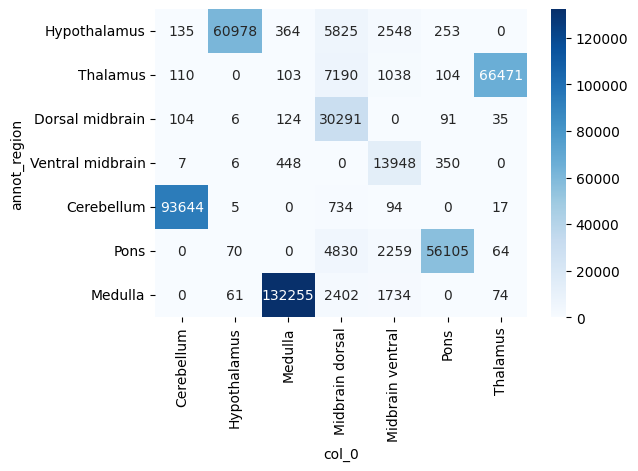

In [96]:
conf_mat = pd.crosstab(adata_bo.obs['annot_region'][idx_nontel], comm_region_nontel)

import matplotlib.pyplot as plt
import seaborn as sns
with plt.rc_context({'figure.figsize' : (6,4)}):
    sns.heatmap(conf_mat, annot=True, cmap='Blues', fmt='d')

In [102]:
adata_bo.obs['annot_region_rev'].astype('category').cat.categories

Index(['Cerebellum', 'Dorsal telencephalon', 'Hypothalamus', 'Medulla',
       'Midbrain dorsal', 'Midbrain ventral', 'Pons', 'Thalamus', 'Unspecific',
       'Ventral telencephalon'],
      dtype='object')

In [103]:
adata_bo.obs['annot_region'].cat.categories

Index(['Dorsal telencephalon', 'Ventral telencephalon', 'Hypothalamus',
       'Thalamus', 'Dorsal midbrain', 'Ventral midbrain', 'Cerebellum', 'Pons',
       'Medulla', 'Unspecific'],
      dtype='object')

In [104]:
adata_bo.obs['annot_region_rev'] = adata_bo.obs['annot_region'].astype('str')
adata_bo.obs['annot_region_rev'][idx_nontel] = comm_region_nontel
adata_bo.obs['annot_region_rev'][adata_bo.obs['annot_region_rev']=='Midbrain dorsal'] = 'Dorsal midbrain'
adata_bo.obs['annot_region_rev'][adata_bo.obs['annot_region_rev']=='Midbrain ventral'] = 'Ventral midbrain'
adata_bo.obs['annot_region_rev'] = adata_bo.obs['annot_region_rev'].astype('category').cat.reorder_categories(adata_bo.obs['annot_region'].cat.categories)
adata_bo.obs['annot_region_rev'].value_counts(sort=False)

Dorsal telencephalon     757626
Ventral telencephalon    158506
Hypothalamus              61126
Thalamus                  66661
Dorsal midbrain           51272
Ventral midbrain          21621
Cerebellum                94000
Pons                      56903
Medulla                  133294
Unspecific               369569
Name: annot_region_rev, dtype: int64

In [113]:
pd.DataFrame({
    'Qian-rev' : adata_bo.obs['annot_region_rev'][adata_bo.obs['publication_protocol']=='Treutlein, 2023: Qian et al., 2016 (doi: 10.1016/j.cell.2016.04.032)'].value_counts(),
    'Jo-rev' : adata_bo.obs['annot_region_rev'][adata_bo.obs['publication_protocol']=='Treutlein, 2023: Jo et al., 2016 (doi: 10.1016/j.stem.2016.07.005)'].value_counts(),
    'Qian-ori' : adata_bo.obs['annot_region'][adata_bo.obs['publication_protocol']=='Treutlein, 2023: Qian et al., 2016 (doi: 10.1016/j.cell.2016.04.032)'].value_counts(),
    'Jo-ori' : adata_bo.obs['annot_region'][adata_bo.obs['publication_protocol']=='Treutlein, 2023: Jo et al., 2016 (doi: 10.1016/j.stem.2016.07.005)'].value_counts()
})

,Qian-rev,Jo-rev,Qian-ori,Jo-ori
Dorsal telencephalon,9,2,9,2
Ventral telencephalon,0,0,0,0
Hypothalamus,1834,338,4030,739
Thalamus,630,1124,1908,1548
Dorsal midbrain,3321,15248,1164,13145
Ventral midbrain,5561,462,3069,221
Cerebellum,6841,18210,6826,18294
Pons,2738,4366,2824,5333
Medulla,8381,6395,9485,6863
Unspecific,19960,13835,19960,13835


In [141]:
adata_bo.obs.columns

Index(['assay_sc', 'assay_differentiation', 'assay_type_differentiation',
       'bio_sample', 'cell_line', 'cell_type', 'development_stage', 'disease',
       'ethnicity', 'gm', 'id', 'individual', 'organ', 'sex', 'state_exact',
       'sample_source', 'source_doi', 'tech_sample', 'organoid_age_days',
       'organoid_age_weeks', 'organoid_age_months', 'publication', 'doi',
       'batch', 'publication_protocol', 'suspension_type_original',
       'cell_line_original', 'cell_type_original',
       'development_stage_original', 'disease_original', 'ethnicity_original',
       'organ_original', 'organism_original', 'sex_original',
       'obs_names_original', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'total_counts_mt',
       'log1p_total_counts_mt', 'pct_counts_mt', 'snapseed_level_1',
       'snapseed_level_2', 'snapseed_level_3', 'snapseed_level_4',
       'snapseed_level_5', 'annot_level_1', 'annot_level_2', 'annot_level_3',
       

In [142]:
adata_bo.write_h5ad('data/phase3_final_0516/ZH_processed_cleanup.h5ad')

## random-walk-based smoothening of regional probabilities

In [116]:
trans_prob_bo = wknn.get_transition_prob_mat(adata_bo.obsm['X_scpoli'], k=20)
trans_prob_bo.shape

(1770578, 1770578)

In [149]:
import pickle
with open('analysis/phase_3_final_0516/outputs/trans_prob_scpoli.pickle', 'wb') as f:
    pickle.dump(trans_prob_bo, f)

In [135]:
df_labs_scanvi['Subregion'].iloc[:,:18].head()

,Head,Brain,Forebrain,Telencephalon,Cortex,Subcortex,Striatum,Hippocampus,Diencephalon,Hypothalamus,Thalamus,Midbrain,Midbrain dorsal,Midbrain ventral,Hindbrain,Cerebellum,Pons,Medulla
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_53,0.0,0.001315,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.034280,0.000416,0.0,0.008684,0.022639,0.027625,0.073897
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_69,0.0,0.004833,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.056464,0.000000,0.0,0.116177,0.000000,0.240532,0.300274
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_72,0.0,0.001315,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.026472,0.000000,0.737688,0.869987
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_76,0.0,0.304494,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.330196,0.000000,1.082770,0.830746
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_78,0.0,0.012592,0.000657,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.001614,0.000000,0.0,0.019845,0.000657,0.012795,0.229020


In [143]:
from tqdm import tqdm
tqdm.pandas()
scores_region_sm = df_labs_scanvi['Subregion'].iloc[:,:18].progress_apply(lambda x: wknn.random_walk_with_restart(x, trans_prob_bo, alpha = 0.8).flatten(), axis=0)
scores_region_sm.head()

100%|██████████| 18/18 [09:00<00:00, 30.01s/it]


,Head,Brain,Forebrain,Telencephalon,Cortex,Subcortex,Striatum,Hippocampus,Diencephalon,Hypothalamus,Thalamus,Midbrain,Midbrain dorsal,Midbrain ventral,Hindbrain,Cerebellum,Pons,Medulla
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_53,0.005153,0.004988,0.004014,5.306908e-08,3.907611e-04,0.003564,1.148888e-03,1.574414e-06,0.000219,0.000457,0.000856,0.038805,0.011165,0.001644,0.018436,0.031304,0.043026,0.093660
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_69,0.000225,0.007639,0.000775,8.824648e-09,1.378336e-05,0.000390,1.704593e-05,1.645521e-06,0.000041,0.006492,0.000098,0.055726,0.002123,0.016282,0.100400,0.000476,0.225664,0.317196
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_72,0.000111,0.010481,0.000166,3.850360e-07,1.057498e-05,0.000051,4.174282e-05,5.606473e-07,0.000017,0.000110,0.000113,0.005299,0.000213,0.000824,0.041108,0.025014,0.619126,0.758589
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_76,0.000004,0.263522,0.002042,1.158839e-09,5.694200e-07,0.000187,4.205794e-07,7.067160e-09,0.000040,0.000320,0.000069,0.034585,0.005082,0.006673,0.336316,0.003166,0.956373,0.767053
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_78,0.000002,0.027371,0.000667,1.462277e-09,2.367691e-06,0.000051,2.068224e-07,2.670733e-08,0.000003,0.000376,0.000021,0.025723,0.000291,0.004652,0.056310,0.006028,0.072437,0.259954


In [151]:
import pickle
with open('analysis/phase_3_final_0516/outputs/Braun/regional_scores_rwwr_alpha0.8.pickle', 'wb') as f:
    pickle.dump(scores_region_sm, f)

In [144]:
from tqdm import tqdm
tqdm.pandas()

freq_hier_regions_sm = pd.concat([ pd.DataFrame(scores_region_sm.loc[:,region_incl[x]].sum(1), columns=[x]) for x in region_incl.keys()], axis=1)
idx_nontel = np.isin(adata_bo.obs['annot_region'], ['Medulla','Cerebellum','Thalamus','Hypothalamus','Pons','Dorsal midbrain','Ventral midbrain'])
comm_region_nontel_sm = freq_hier_regions_sm.loc[idx_nontel,:].progress_apply(lambda x: find_commonnestn_recursive(x, region_hier_nontelen, 'Brain', nmax=1), axis=1)
comm_region_nontel_sm.head()

100%|██████████| 484877/484877 [11:36<00:00, 695.82it/s]


homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_53    Medulla
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_69    Medulla
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_72    Medulla
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_76       Pons
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_78    Medulla
dtype: object

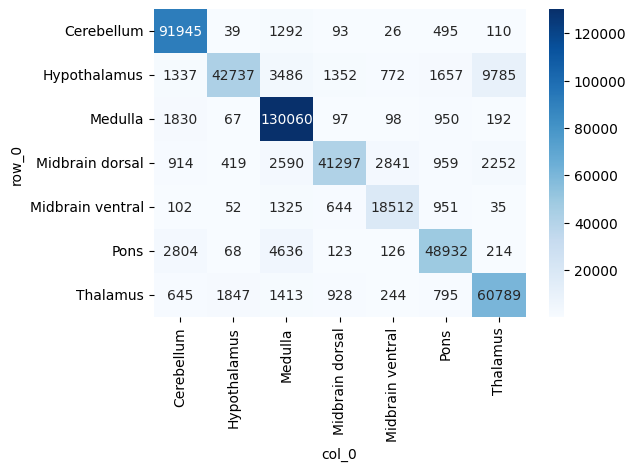

In [145]:
conf_mat = pd.crosstab(comm_region_nontel, comm_region_nontel_sm)

import matplotlib.pyplot as plt
import seaborn as sns
with plt.rc_context({'figure.figsize' : (6,4)}):
    sns.heatmap(conf_mat, annot=True, cmap='Blues', fmt='d')

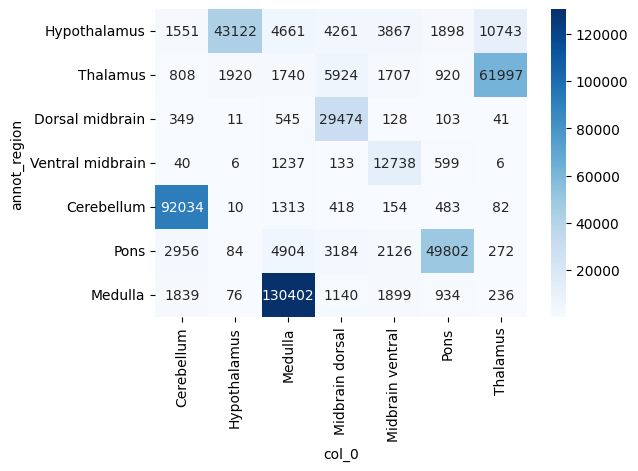

In [146]:
conf_mat = pd.crosstab(adata_bo.obs['annot_region'][idx_nontel], comm_region_nontel_sm)

import matplotlib.pyplot as plt
import seaborn as sns
with plt.rc_context({'figure.figsize' : (6,4)}):
    sns.heatmap(conf_mat, annot=True, cmap='Blues', fmt='d')

In [147]:
adata_bo.obs['annot_region_rev2'] = adata_bo.obs['annot_region'].astype('str')
adata_bo.obs['annot_region_rev2'][idx_nontel] = comm_region_nontel_sm
adata_bo.obs['annot_region_rev2'][adata_bo.obs['annot_region_rev2']=='Midbrain dorsal'] = 'Dorsal midbrain'
adata_bo.obs['annot_region_rev2'][adata_bo.obs['annot_region_rev2']=='Midbrain ventral'] = 'Ventral midbrain'
adata_bo.obs['annot_region_rev2'] = adata_bo.obs['annot_region_rev2'].astype('category').cat.reorder_categories(adata_bo.obs['annot_region'].cat.categories)
adata_bo.obs['annot_region_rev2'].value_counts(sort=False)

Dorsal telencephalon     757626
Ventral telencephalon    158506
Hypothalamus              45229
Thalamus                  73377
Dorsal midbrain           44534
Ventral midbrain          22619
Cerebellum                99577
Pons                      54739
Medulla                  144802
Unspecific               369569
Name: annot_region_rev2, dtype: int64

In [150]:
pd.DataFrame({
    'Qian-rev2' : adata_bo.obs['annot_region_rev2'][adata_bo.obs['publication_protocol']=='Treutlein, 2023: Qian et al., 2016 (doi: 10.1016/j.cell.2016.04.032)'].value_counts(),
    'Jo-rev2' : adata_bo.obs['annot_region_rev2'][adata_bo.obs['publication_protocol']=='Treutlein, 2023: Jo et al., 2016 (doi: 10.1016/j.stem.2016.07.005)'].value_counts(),
    'Qian-rev' : adata_bo.obs['annot_region_rev'][adata_bo.obs['publication_protocol']=='Treutlein, 2023: Qian et al., 2016 (doi: 10.1016/j.cell.2016.04.032)'].value_counts(),
    'Jo-rev' : adata_bo.obs['annot_region_rev'][adata_bo.obs['publication_protocol']=='Treutlein, 2023: Jo et al., 2016 (doi: 10.1016/j.stem.2016.07.005)'].value_counts(),
    'Qian-ori' : adata_bo.obs['annot_region'][adata_bo.obs['publication_protocol']=='Treutlein, 2023: Qian et al., 2016 (doi: 10.1016/j.cell.2016.04.032)'].value_counts(),
    'Jo-ori' : adata_bo.obs['annot_region'][adata_bo.obs['publication_protocol']=='Treutlein, 2023: Jo et al., 2016 (doi: 10.1016/j.stem.2016.07.005)'].value_counts()
})

,Qian-rev2,Jo-rev2,Qian-rev,Jo-rev,Qian-ori,Jo-ori
Dorsal telencephalon,9,2,9,2,9,2
Ventral telencephalon,0,0,0,0,0,0
Hypothalamus,1389,208,1834,338,4030,739
Thalamus,492,828,630,1124,1908,1548
Dorsal midbrain,2365,15257,3321,15248,1164,13145
Ventral midbrain,6805,408,5561,462,3069,221
Cerebellum,7438,19160,6841,18210,6826,18294
Pons,2211,3897,2738,4366,2824,5333
Medulla,8606,6385,8381,6395,9485,6863
Unspecific,19960,13835,19960,13835,19960,13835


/local1/scratch/hezhi/temp/ipykernel_48434/2784710702.py:13: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


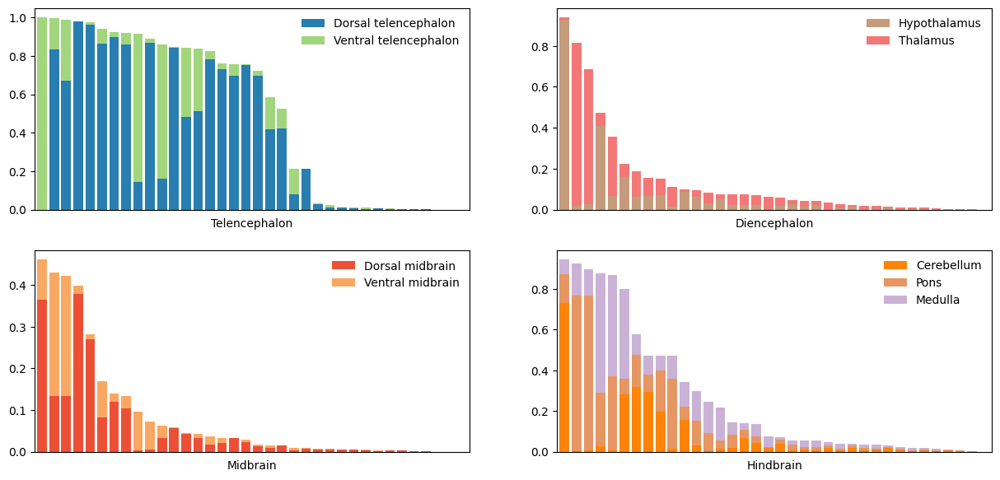

In [29]:
idx = adata_bo.obs['annot_level_1'] == 'Neuron'
freq_regions = pd.crosstab(adata_bo.obs['publication_protocol'][idx], adata_bo.obs['annot_region_rev2'][idx])
prop_regions = freq_regions.apply(lambda x: x/sum(x), axis=1)
prop_regions.head()

import matplotlib.pyplot as plt
fig, ax = plt.subplots(2,2,figsize=(15,7))
cols = np.array(['#287EB1','#A1D67D','#C59B7B','#F47777','#EB5037','#F9A863','#FE8307','#E69663','#CAB2D6'])
prop_regions.iloc[np.argsort(-prop_regions.iloc[:,:2].sum(axis=1)),:2].plot(kind='bar', stacked=True, width=0.8, color=cols[:2], ax=ax[0,0], xticks=[], xlabel='Telencephalon').legend(loc='upper right', frameon=False)
prop_regions.iloc[np.argsort(-prop_regions.iloc[:,2:4].sum(axis=1)),2:4].plot(kind='bar', stacked=True, width=0.8, color=cols[2:4], ax=ax[0,1], xticks=[], xlabel='Diencephalon').legend(loc='upper right', frameon=False)
prop_regions.iloc[np.argsort(-prop_regions.iloc[:,4:6].sum(axis=1)),4:6].plot(kind='bar', stacked=True, width=0.8, color=cols[4:6], ax=ax[1,0], xticks=[], xlabel='Midbrain').legend(loc='upper right', frameon=False)
prop_regions.iloc[np.argsort(-prop_regions.iloc[:,6:9].sum(axis=1)),6:9].plot(kind='bar', stacked=True, width=0.8, color=cols[6:9], ax=ax[1,1], xticks=[], xlabel='Hindbrain').legend(loc='upper right', frameon=False)
fig.show()

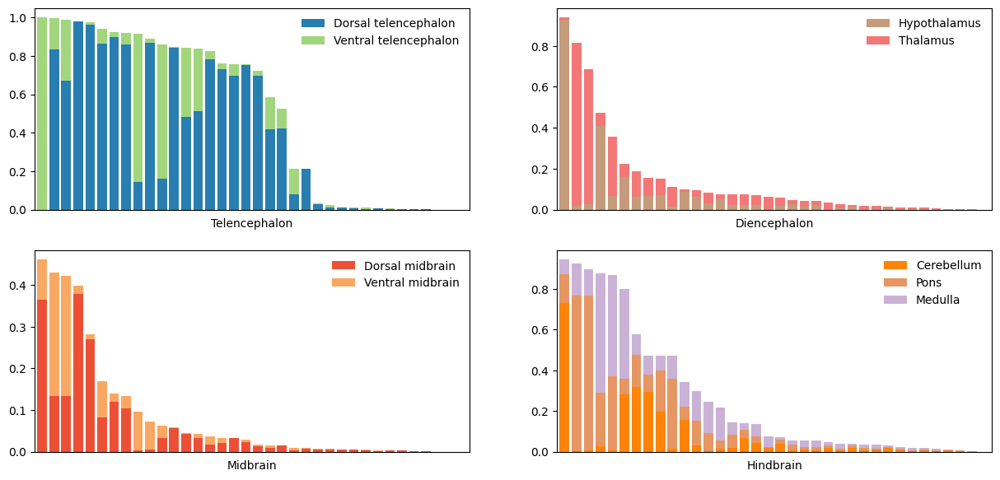

In [9]:
idx = adata_bo.obs['annot_level_1'] == 'Neuron'
freq_regions = pd.crosstab(adata_bo.obs['publication_protocol'][idx], adata_bo.obs['annot_region_rev2'][idx])
prop_regions = freq_regions.apply(lambda x: x/sum(x), axis=1)
prop_regions.head()

import matplotlib.pyplot as plt
fig, ax = plt.subplots(2,2,figsize=(15,7))
cols = np.array(['#287EB1','#A1D67D','#C59B7B','#F47777','#EB5037','#F9A863','#FE8307','#E69663','#CAB2D6'])
prop_regions.iloc[np.argsort(-prop_regions.iloc[:,:2].sum(axis=1)),:2].plot(kind='bar', stacked=True, width=0.8, color=cols[:2], ax=ax[0,0], xticks=[], xlabel='Telencephalon').legend(loc='upper right', frameon=False)
prop_regions.iloc[np.argsort(-prop_regions.iloc[:,2:4].sum(axis=1)),2:4].plot(kind='bar', stacked=True, width=0.8, color=cols[2:4], ax=ax[0,1], xticks=[], xlabel='Diencephalon').legend(loc='upper right', frameon=False)
prop_regions.iloc[np.argsort(-prop_regions.iloc[:,4:6].sum(axis=1)),4:6].plot(kind='bar', stacked=True, width=0.8, color=cols[4:6], ax=ax[1,0], xticks=[], xlabel='Midbrain').legend(loc='upper right', frameon=False)
prop_regions.iloc[np.argsort(-prop_regions.iloc[:,6:9].sum(axis=1)),6:9].plot(kind='bar', stacked=True, width=0.8, color=cols[6:9], ax=ax[1,1], xticks=[], xlabel='Hindbrain').legend(loc='upper right', frameon=False)
fig.savefig('analysis/phase_3_final_0516/outputs/brain_region_proportions_per_dataset.pdf')

In [30]:
prop_regions.iloc[np.argsort(-prop_regions.iloc[:,4:6].sum(axis=1)),4:6].head()

annot_region_rev2,Dorsal midbrain,Ventral midbrain
publication_protocol,,
"Sawada, 2020: Sawada, 2020 (doi: 10.1038/s41380-020-0844-z)",0.364299,0.096539
"Treutlein, 2023: Qian et al., 2016 (doi: 10.1016/j.cell.2016.04.032)",0.133727,0.295849
"Fiorenzano, 2021: Fiorenzano, 2021 (doi: 10.1038/s41467-021-27464-5); standard",0.132566,0.288337
"Treutlein, 2023: Jo et al., 2016 (doi: 10.1016/j.stem.2016.07.005)",0.377872,0.021109
"Xiang, 2019: Xiang, 2019 (doi: 10.1016/j.stem.2018.12.015)",0.269391,0.012232


/local1/scratch/hezhi/temp/ipykernel_48434/1681537854.py:13: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


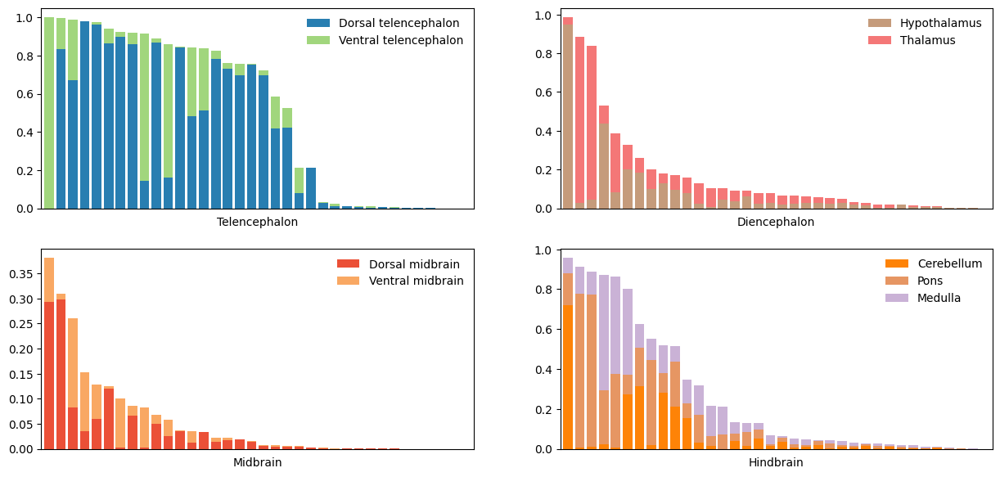

In [31]:
idx = adata_bo.obs['annot_level_1'] == 'Neuron'
freq_regions = pd.crosstab(adata_bo.obs['publication_protocol'][idx], adata_bo.obs['annot_region'][idx])
prop_regions = freq_regions.apply(lambda x: x/sum(x), axis=1)
prop_regions.head()

import matplotlib.pyplot as plt
fig, ax = plt.subplots(2,2,figsize=(15,7))
cols = np.array(['#287EB1','#A1D67D','#C59B7B','#F47777','#EB5037','#F9A863','#FE8307','#E69663','#CAB2D6'])
prop_regions.iloc[np.argsort(-prop_regions.iloc[:,:2].sum(axis=1)),:2].plot(kind='bar', stacked=True, width=0.8, color=cols[:2], ax=ax[0,0], xticks=[], xlabel='Telencephalon').legend(loc='upper right', frameon=False)
prop_regions.iloc[np.argsort(-prop_regions.iloc[:,2:4].sum(axis=1)),2:4].plot(kind='bar', stacked=True, width=0.8, color=cols[2:4], ax=ax[0,1], xticks=[], xlabel='Diencephalon').legend(loc='upper right', frameon=False)
prop_regions.iloc[np.argsort(-prop_regions.iloc[:,4:6].sum(axis=1)),4:6].plot(kind='bar', stacked=True, width=0.8, color=cols[4:6], ax=ax[1,0], xticks=[], xlabel='Midbrain').legend(loc='upper right', frameon=False)
prop_regions.iloc[np.argsort(-prop_regions.iloc[:,6:9].sum(axis=1)),6:9].plot(kind='bar', stacked=True, width=0.8, color=cols[6:9], ax=ax[1,1], xticks=[], xlabel='Hindbrain').legend(loc='upper right', frameon=False)
fig.show()

In [32]:
prop_regions.iloc[np.argsort(-prop_regions.iloc[:,4:6].sum(axis=1)),4:6].head()

annot_region,Dorsal midbrain,Ventral midbrain
publication_protocol,,
"Sawada, 2020: Sawada, 2020 (doi: 10.1038/s41380-020-0844-z)",0.293260,0.087432
"Treutlein, 2023: Jo et al., 2016 (doi: 10.1016/j.stem.2016.07.005)",0.297602,0.012062
"Fiorenzano, 2021: Fiorenzano, 2021 (doi: 10.1038/s41467-021-27464-5); standard",0.081998,0.177851
"Treutlein, 2023: Qian et al., 2016 (doi: 10.1016/j.cell.2016.04.032)",0.035048,0.118171
"Birey, 2017: Birey, 2017 (doi: 10.1038/nature22330)",0.059076,0.069817


In [43]:
adata_bo.obs['annot_level_3_rev2'] = adata_bo.obs['annot_level_3'].astype('str')
idx = np.where(adata_bo.obs['annot_region_rev2']!='Unspecific')[0]
adata_bo.obs['annot_level_3_rev2'][idx] = [ ' '.join([adata_bo.obs['annot_region_rev2'][i], adata_bo.obs['annot_level_1'][i]]) for i in idx ]
adata_bo.obs['annot_level_3_rev2'] = [ re.sub('telencephalon','Telencephalic',x) for x in adata_bo.obs['annot_level_3_rev2'] ]
adata_bo.obs['annot_level_3_rev2'] = [ re.sub('Cerebellum','Cerebellar',x) for x in adata_bo.obs['annot_level_3_rev2'] ]
adata_bo.obs['annot_level_3_rev2'] = [ re.sub('Thalamus','Thalamic',x) for x in adata_bo.obs['annot_level_3_rev2'] ]
adata_bo.obs['annot_level_3_rev2'] = [ re.sub('Hypothalamus','Hypothalamic',x) for x in adata_bo.obs['annot_level_3_rev2'] ]
adata_bo.obs['annot_level_3_rev2'] = [ re.sub('Hypothalamus','Hypothalamic',x) for x in adata_bo.obs['annot_level_3_rev2'] ]
adata_bo.obs['annot_level_3_rev2'] = [ re.sub('midbrain','Midbrain',x) for x in adata_bo.obs['annot_level_3_rev2'] ]
adata_bo.obs['annot_level_3_rev2'] = adata_bo.obs['annot_level_3_rev2'].astype('category').cat.reorder_categories(adata_bo.obs['annot_level_3'].cat.categories)
adata_bo.obs['annot_level_3_rev2'].value_counts(sort=False)

/local1/scratch/hezhi/temp/ipykernel_25420/2989010722.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_bo.obs['annot_level_3_rev2'][idx] = [ ' '.join([adata_bo.obs['annot_region_rev2'][i], adata_bo.obs['annot_level_1'][i]]) for i in idx ]


PSC                               2187
Neuroepithelium                  91689
Dorsal Telencephalic NPC        224111
Dorsal Telencephalic IP          15433
Dorsal Telencephalic Neuron     518082
Ventral Telencephalic NPC        46500
Ventral Telencephalic Neuron    112006
Hypothalamic NPC                  8881
Hypothalamic Neuron              36348
Thalamic NPC                     38754
Thalamic Neuron                  34623
Dorsal Midbrain NPC              23422
Dorsal Midbrain Neuron           21112
Ventral Midbrain NPC             12186
Ventral Midbrain Neuron          10433
Cerebellar NPC                   58740
Cerebellar Neuron                40837
Pons NPC                         20162
Pons Neuron                      34577
Medulla NPC                      96166
Medulla Neuron                   48636
Glioblast                        79506
Astrocyte                        48956
OPC                               8325
CP                               77315
NC Derivatives           

In [44]:
adata_bo.write_h5ad('data/phase3_final_0516/ZH_processed_cleanup.h5ad')

In [45]:
important_features = ['SOX2','NES','DCX','STMN2','MAP2','PRPH','HOPX','S100B','AQP4','GFAP','OLIG1','MBP','SOX10','CLDN5','AIF1','DCN','PDGFRA','PDGFRB','ACTA2',
                      'FOXG1','EMX1','GLI3','PAX6','EOMES','NEUROD6','TBR1','BCL11B','SATB2','DLX2','DLX5','ISL1','NKX2-1',
                      'LHX5','LHX9','OTX2','CYP26A1','HOXB2','PCP4','CA8','PRDM8','SLC17A7','SLC17A6','SLC32A1','GAD1','GAD2','TH','CHAT','POU4F1','PLD5',
                      'SHH','WNT8A','WNT7B','FGF8','FGF2','FGF7','BMP4','BMP7','MKI67',
                      'WLS','WNT4','WNT2B','SIX3','SIX6','EN2','GBX2','IRX2','IRX3','EMX2','FGF17','PAX3','PAX7','TFAP2A','RAX',
                      'ESRRB','PRKG1','ROBO3','UBASH3B','GATA3','SOX14','OTX2','SIX3']
adata_bo_sub = adata_bo[:,important_features]

In [46]:
adata_bo_sub.write_h5ad('data/phase3_final_0516/ZH_processed_cleanup_feature_subset.h5ad')

/links/groups/treutlein/USERS/zhisong_he/miniconda3/envs/env_scg2/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
/links/groups/treutlein/USERS/zhisong_he/miniconda3/envs/env_scg2/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


## Further update the NTT labels for neurons based on the updated regional labels (random-walk-based smoothened)

In [12]:
adata_ref = sc.read_h5ad('ext/models_Braun/braun_2022_fetal_brain_v2_cleanedup.h5ad')

/links/groups/treutlein/USERS/zhisong_he/miniconda3/envs/env_scg2/lib/python3.9/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/links/groups/treutlein/USERS/zhisong_he/miniconda3/envs/env_scg2/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [14]:
adata_ref.obs.columns

Index(['CellID', 'SampleID', 'Chemistry', 'Donor', 'Sex', 'Age', 'Region',
       'Subregion', 'Subdivision', 'Tissue', 'SummarizedRegion',
       'TopLevelCluster', 'Cluster', 'CellClass', 'IsNeural',
       'NeurotransmitterTransporter', 'CellType', 'CellCycleFraction',
       'DoubletScore', 'DoubletFlag', 'PresenceScoreOverall_HNOCA',
       'PresenceScoreMax_HNOCA', 'louvain_scvi_res2', 'louvain_scvi_res20'],
      dtype='object')

In [15]:
freq_ref_cl_subregions = pd.get_dummies(adata_ref.obs.Cluster).transpose().dot(pd.get_dummies(adata_ref.obs.Subregion))
freq_ref_cl_subregions.head()

,Head,Brain,Forebrain,Telencephalon,Cortex,Subcortex,Striatum,Hippocampus,Diencephalon,Hypothalamus,Thalamus,Midbrain,Midbrain dorsal,Midbrain ventral,Hindbrain,Cerebellum,Pons,Medulla
0,0,0,0,0,4,0,0,0,0,0,0,3,0,0,52,75,186,188
1,0,0,0,0,6,0,0,0,0,0,0,1,0,0,74,69,196,252
2,0,0,0,0,2,0,0,0,0,0,0,0,0,0,41,24,218,222
3,0,0,0,0,3,0,0,0,0,0,0,0,0,0,56,62,247,79
4,0,0,0,0,9,0,0,0,0,0,0,0,0,0,2,72,251,172


In [17]:
region_incl = {'Forebrain' : ['Forebrain','Telencephalon','Cortex','Subcortex','Striatum','Hippocampus','Diencephalon','Hypothalamus','Thalamus'],
               'Telencephalon': ['Telencephalon','Cortex','Subcortex','Striatum'],
               'Cortex': ['Cortex'],
               'Subcortex': ['Subcortex','Striatum'],
               'Diencephalon': ['Diencephalon','Thalamus','Hypothalamus'],
               'Hypothalamus': ['Hypothalamus'],
               'Thalamus': ['Thalamus'],
               'Midbrain': ['Midbrain','Midbrain dorsal','Midbrain ventral'],
               'Midbrain dorsal': ['Midbrain dorsal'],
               'Midbrain ventral': ['Midbrain ventral'],
               'Hindbrain': ['Hindbrain','Cerebellum','Pons','Medulla'],
               'Cerebellum': ['Cerebellum'],
               'Pons': ['Pons'],
               'Medulla': ['Medulla']}
region_hier = {'Brain' : ['Forebrain','Midbrain','Hindbrain'],
               'Forebrain' : ['Telencephalon','Diencephalon'],
               'Telencephalon' : ['Cortex','Subcortex'],
               'Diencephalon' : ['Hypothalamus','Thalamus'],
               'Midbrain' : ['Midbrain dorsal','Midbrain ventral'],
               'Hindbrain' : ['Cerebellum','Pons','Medulla']}

In [18]:
freq_ref_cl_hier_regions = pd.concat([ pd.DataFrame(freq_ref_cl_subregions.loc[:,region_incl[x]].sum(1), columns=[x]) for x in region_incl.keys()], axis=1)
freq_ref_cl_hier_regions

,Forebrain,Telencephalon,Cortex,Subcortex,Diencephalon,Hypothalamus,Thalamus,Midbrain,Midbrain dorsal,Midbrain ventral,Hindbrain,Cerebellum,Pons,Medulla
0,4,4,4,0,0,0,0,3,0,0,501,75,186,188
1,6,6,6,0,0,0,0,1,0,0,591,69,196,252
2,2,2,2,0,0,0,0,0,0,0,505,24,218,222
3,3,3,3,0,0,0,0,0,0,0,444,62,247,79
4,9,9,9,0,0,0,0,0,0,0,497,72,251,172
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
612,124,60,10,50,49,46,3,140,31,54,523,25,153,212
613,27,9,0,9,12,12,0,74,6,31,369,18,215,111
614,176,100,3,97,53,43,10,504,161,207,263,99,118,35
615,538,264,154,110,27,17,10,4,1,0,1,0,1,0


In [19]:
def find_commonnest2_recursive(x, hier, start_at, thres_over = 0.5):
    idx_max = x[hier[start_at]].idxmax()
    if idx_max in hier.keys():
        return find_commonnest2_recursive(x, hier, idx_max)
    largest2 = x[hier[start_at]].nlargest(2)
    if largest2.max() - largest2.min() > largest2.min() * thres_over:
        return [idx_max]
    else:
        return list(largest2.index)
comm_2region_ref_cl = freq_ref_cl_hier_regions.apply(lambda x: find_commonnest2_recursive(x, region_hier, 'Brain'), 1)
comm_2region_ref_cl

0                          [Medulla, Pons]
1                          [Medulla, Pons]
2                          [Medulla, Pons]
3                                   [Pons]
4                          [Pons, Medulla]
                      ...                 
612                        [Medulla, Pons]
613                                 [Pons]
614    [Midbrain ventral, Midbrain dorsal]
615                    [Cortex, Subcortex]
616                               [Cortex]
Length: 617, dtype: object

In [20]:
final_subregions = ['Cortex','Subcortex','Hypothalamus','Thalamus','Midbrain dorsal','Midbrain ventral','Cerebellum','Pons','Medulla']
dummy_ref_cl_final_subregions = pd.concat(list(comm_2region_ref_cl.apply(lambda x: pd.DataFrame(np.isin(final_subregions, x)[None,:]).set_axis(final_subregions, axis=1)))).set_index(np.char.mod('%d', comm_2region_ref_cl.index)) * 1
dummy_ref_cl_final_subregions

,Cortex,Subcortex,Hypothalamus,Thalamus,Midbrain dorsal,Midbrain ventral,Cerebellum,Pons,Medulla
0,0,0,0,0,0,0,0,1,1
1,0,0,0,0,0,0,0,1,1
2,0,0,0,0,0,0,0,1,1
3,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...
612,0,0,0,0,0,0,0,1,1
613,0,0,0,0,0,0,0,1,0
614,0,0,0,0,1,1,0,0,0
615,1,1,0,0,0,0,0,0,0


In [23]:
import re

meta_ref_cl = pd.read_csv('/links/groups/treutlein/USERS/zhisong_he/Work/public_datasets/Linnarsson_fetal_human_brain_atlas/preprint/meta_clusters.tsv', sep="\t")
meta_ref_cl = meta_ref_cl.loc[meta_ref_cl['PoolCleanOrder']!='--',:].sort_values('PoolCleanOrder')
meta_ref_cl = meta_ref_cl.set_axis(meta_ref_cl['PoolCleanOrder'], axis=0)
meta_ref_cl_neuron = meta_ref_cl[meta_ref_cl['Class'].isin(['Neuron','Neuroblast'])]

annot_terms = np.unique(np.concatenate([ np.array(x.split(' | ')) for x in meta_ref_cl_neuron.AutoAnnotation ]))
nt_terms = annot_terms[[re.search(r'^NT-', x) is not None for x in annot_terms]]
has_nt_terms_ref_cl_neuron = np.array([ np.array([ np.sum(np.isin(np.array(x.split(" | ")), term))>0 for x in meta_ref_cl_neuron['AutoAnnotation'] ]) for term in nt_terms ])
has_nt_terms_ref_cl_neuron = pd.DataFrame(np.transpose(has_nt_terms_ref_cl_neuron), index = meta_ref_cl_neuron.index, columns=nt_terms)

has_nt_terms_ref_cl_neuron_nodouble = has_nt_terms_ref_cl_neuron.copy()
has_nt_terms_ref_cl_neuron_nodouble['NT-VGLUT'] = has_nt_terms_ref_cl_neuron_nodouble[['NT-VGLUT1','NT-VGLUT2','NT-VGLUT3']].sum(1) > 0
has_nt_terms_ref_cl_neuron_nodouble = has_nt_terms_ref_cl_neuron_nodouble[np.setdiff1d(has_nt_terms_ref_cl_neuron_nodouble.columns, ['NT-VGLUT1','NT-VGLUT2','NT-VGLUT3'])]
has_nt_terms_ref_cl_neuron_nodouble.loc[has_nt_terms_ref_cl_neuron_nodouble.sum(1)>1,:] = False
has_nt_terms_ref_cl_neuron_nodouble

,NT-CHOL,NT-GABA,NT-GLY,NT-SER,NT-VGLUT
PoolCleanOrder,,,,,
0,False,False,False,False,False
113,False,False,False,False,False
116,False,False,False,False,False
119,False,False,False,False,True
188,False,True,False,False,False
...,...,...,...,...,...
603,False,False,False,False,True
604,False,False,False,False,False
605,False,False,False,False,False


In [24]:
freq_ref_neuron_subtypes_subregions = dummy_ref_cl_final_subregions.loc[has_nt_terms_ref_cl_neuron_nodouble.index,:].transpose().dot(has_nt_terms_ref_cl_neuron_nodouble)
constraint_neuron_subtypes_subregions = freq_ref_neuron_subtypes_subregions > 0
constraint_neuron_subtypes_subregions

,NT-CHOL,NT-GABA,NT-GLY,NT-SER,NT-VGLUT
Cortex,False,True,True,False,True
Subcortex,False,True,False,False,True
Hypothalamus,False,True,False,False,True
Thalamus,False,True,False,False,True
Midbrain dorsal,False,True,False,False,True
Midbrain ventral,False,True,True,False,True
Cerebellum,False,True,True,False,True
Pons,True,True,True,True,True
Medulla,True,True,True,True,True


In [26]:
ntt_annot_ref = pd.read_csv('/links/groups/treutlein/USERS/zhisong_he/Work/public_datasets/Linnarsson_fetal_human_brain_atlas/preprint_cellranger/ntt_annotation.tsv', sep='\t', index_col=0)
ntt_annot_ref_nonredun = ntt_annot_ref.copy()
ntt_annot_ref_nonredun['NT-VGLUT'] = ntt_annot_ref_nonredun[['NT-VGLUT1','NT-VGLUT2','NT-VGLUT3']].sum(1) > 0
ntt_annot_ref_nonredun = ntt_annot_ref_nonredun[np.setdiff1d(ntt_annot_ref_nonredun.columns, ['NT-VGLUT1','NT-VGLUT2','NT-VGLUT3'])]
ntt_annot_ref_nonredun.loc[ntt_annot_ref_nonredun.sum(1)>1,:] = False
ntt_annot_ref_nonredun

,NT-CHOL,NT-GABA,NT-GLY,NT-SER,NT-VGLUT
CellID,,,,,
10X89_1:ACGCCAGTCGATAGAA,False,False,False,False,False
10X89_1:CTTCTCTAGTCAAGGC,False,False,True,False,False
10X89_1:GGGCACTAGCGATATA,False,False,False,False,False
10X89_1:TTCTACAAGGTGTGGT,False,False,False,False,False
10X89_2:AACACGTAGACTGTAA,False,False,False,False,False
...,...,...,...,...,...
10X302_7:AGAGAATAGAGGATCC,False,False,False,False,False
10X302_8:AAGCCATTCCACCTCA,False,False,False,False,False
10X302_8:ACGGTTAGTTAGGCCC,False,False,False,False,False


In [28]:
import pickle
with open('analysis/phase_3_final_0516/outputs/Braun/wknn_q2r_Braun2_scANVI.pickle', 'rb') as file:
    wknn = pickle.load(file)

In [29]:
scores_ntt_nonredun = pd.DataFrame(wknn @ ntt_annot_ref_nonredun, columns=ntt_annot_ref_nonredun.columns, index=adata_bo.obs_names)
scores_ntt_nonredun

,NT-CHOL,NT-GABA,NT-GLY,NT-SER,NT-VGLUT
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_53,0.0,0.000957,0.000000,0.000000,0.000000
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_69,0.0,0.046967,0.000000,0.000000,0.000000
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_72,0.0,1.020361,0.344466,0.071023,0.199613
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_76,0.0,0.000000,0.000000,0.000000,0.000000
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_78,0.0,0.016537,0.000000,0.000000,0.000000
...,...,...,...,...,...
homosapiens_cerebralcortex_2017_smartseq2_sloansteven_001_d10_1016_j_neuron_2017_07_035_706,0.0,0.083906,0.000000,0.000000,0.000000
homosapiens_cerebralcortex_2017_smartseq2_sloansteven_001_d10_1016_j_neuron_2017_07_035_707,0.0,0.211433,0.000000,0.000000,0.000000
homosapiens_cerebralcortex_2017_smartseq2_sloansteven_001_d10_1016_j_neuron_2017_07_035_708,0.0,0.004074,0.000000,0.000000,0.024358
homosapiens_cerebralcortex_2017_smartseq2_sloansteven_001_d10_1016_j_neuron_2017_07_035_709,0.0,0.023206,0.000000,0.000000,0.004074


In [49]:
ntt_bo = pd.DataFrame(np.repeat("", adata_bo.shape[0]), columns = ['NT']).set_index(adata_bo.obs_names)
ntt_bo.loc[adata_bo.obs['annot_level_3_rev2']=='Dorsal Telencephalic Neuron','NT'] = 'NT-VGLUT'
ntt_bo.loc[adata_bo.obs['annot_level_3_rev2']=='Ventral Telencephalic Neuron','NT'] = 'NT-GABA'
ntt_bo.loc[adata_bo.obs['annot_level_3_rev2']=='Hypothalamic Neuron','NT'] = scores_ntt_nonredun.loc[adata_bo.obs['annot_level_3_rev2']=='Hypothalamic Neuron',constraint_neuron_subtypes_subregions.loc['Hypothalamus',:]].idxmax(1)
ntt_bo.loc[adata_bo.obs['annot_level_3_rev2']=='Thalamic Neuron','NT'] = scores_ntt_nonredun.loc[adata_bo.obs['annot_level_3_rev2']=='Thalamic Neuron',constraint_neuron_subtypes_subregions.loc['Thalamus',:]].idxmax(1)
ntt_bo.loc[adata_bo.obs['annot_level_3_rev2']=='Dorsal Midbrain Neuron','NT'] = scores_ntt_nonredun.loc[adata_bo.obs['annot_level_3_rev2']=='Dorsal Midbrain Neuron',constraint_neuron_subtypes_subregions.loc['Midbrain dorsal',:]].idxmax(1)
ntt_bo.loc[adata_bo.obs['annot_level_3_rev2']=='Ventral Midbrain Neuron','NT'] = scores_ntt_nonredun.loc[adata_bo.obs['annot_level_3_rev2']=='Ventral Midbrain Neuron',constraint_neuron_subtypes_subregions.loc['Midbrain ventral',:]].idxmax(1)
ntt_bo.loc[adata_bo.obs['annot_level_3_rev2']=='Cerebellar Neuron','NT'] = scores_ntt_nonredun.loc[adata_bo.obs['annot_level_3_rev2']=='Cerebellar Neuron',constraint_neuron_subtypes_subregions.loc['Cerebellum',:]].idxmax(1)
ntt_bo.loc[adata_bo.obs['annot_level_3_rev2']=='Pons Neuron','NT'] = scores_ntt_nonredun.loc[adata_bo.obs['annot_level_3_rev2']=='Pons Neuron',constraint_neuron_subtypes_subregions.loc['Pons',:]].idxmax(1)
ntt_bo.loc[adata_bo.obs['annot_level_3_rev2']=='Medulla Neuron','NT'] = scores_ntt_nonredun.loc[adata_bo.obs['annot_level_3_rev2']=='Medulla Neuron',constraint_neuron_subtypes_subregions.loc['Medulla',:]].idxmax(1)
ntt_bo.head()

,NT
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_53,
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_69,
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_72,NT-GABA
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_76,
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_78,


In [50]:
ntt_bo.NT.value_counts()

            913924
NT-VGLUT    645471
NT-GABA     188059
NT-GLY       19224
NT-CHOL       3264
NT-SER         636
Name: NT, dtype: int64

In [51]:
adata_bo.obs['annot_ntt_rev2'] = ntt_bo.NT
adata_bo.obs['annot_level_4_rev2'] = [adata_bo.obs['annot_level_3_rev2'][i] + " " + adata_bo.obs['annot_ntt_rev2'][i] if adata_bo.obs['annot_ntt_rev2'][i] != "" else adata_bo.obs['annot_level_3_rev2'][i] for i in range(adata_bo.shape[0])]
adata_bo.obs['annot_level_4_rev2'] = adata_bo.obs['annot_level_4_rev2'].astype('category').cat.reorder_categories(adata_bo.obs['annot_level_4'].cat.categories)
adata_bo.obs['annot_level_4_rev2'].value_counts(sort=False)

PSC                                       2187
Neuroepithelium                          91689
Dorsal Telencephalic NPC                224111
Dorsal Telencephalic IP                  15433
Dorsal Telencephalic Neuron NT-VGLUT    518082
Ventral Telencephalic NPC                46500
Ventral Telencephalic Neuron NT-GABA    112006
Hypothalamic NPC                          8881
Hypothalamic Neuron NT-VGLUT             13705
Hypothalamic Neuron NT-GABA              22643
Thalamic NPC                             38754
Thalamic Neuron NT-VGLUT                 27108
Thalamic Neuron NT-GABA                   7515
Dorsal Midbrain NPC                      23422
Dorsal Midbrain Neuron NT-VGLUT          15498
Dorsal Midbrain Neuron NT-GABA            5614
Ventral Midbrain NPC                     12186
Ventral Midbrain Neuron NT-VGLUT          7672
Ventral Midbrain Neuron NT-GABA           2503
Ventral Midbrain Neuron NT-GLY             258
Cerebellar NPC                           58740
Cerebellar Ne

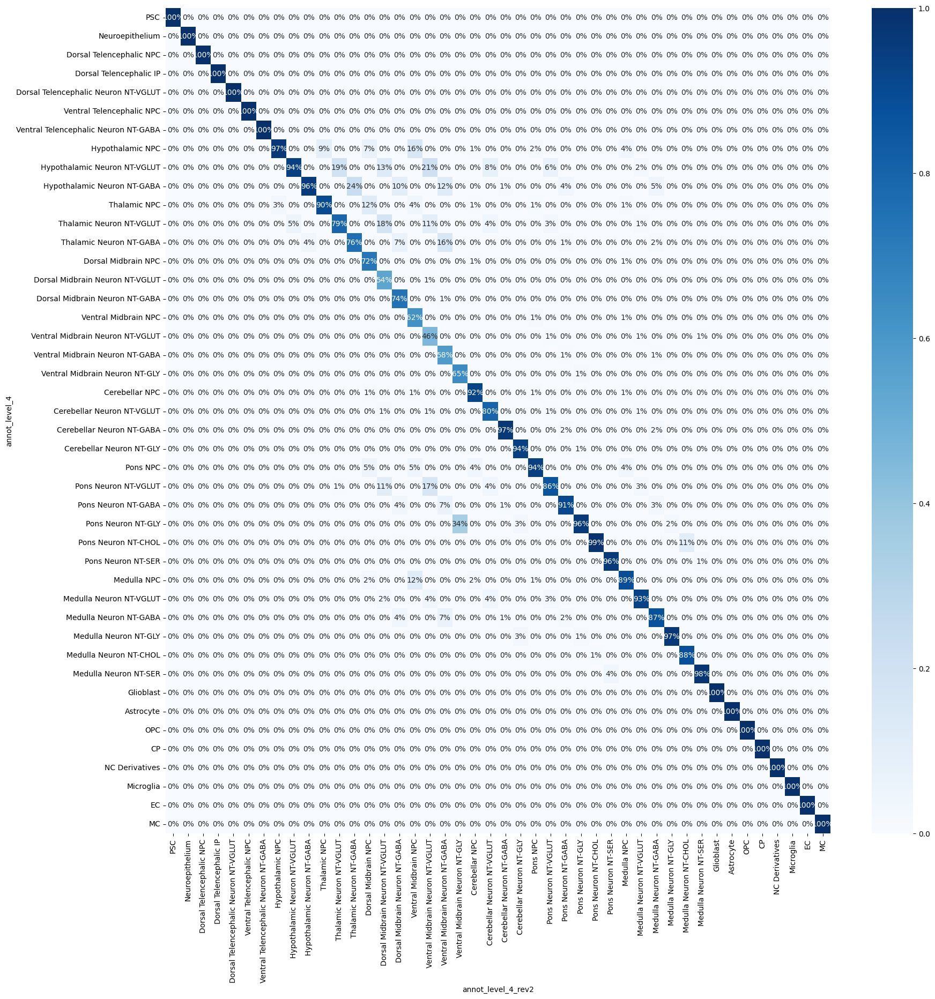

In [54]:
conf_mat = pd.crosstab(adata_bo.obs['annot_level_4'], adata_bo.obs['annot_level_4_rev2'])

import seaborn as sns
from sklearn.preprocessing import scale
mat = conf_mat.apply(lambda x: x/np.sum(x), 0)

from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (20, 20)}):
    sns.heatmap(mat, annot=True, cmap='Blues', fmt='.0%')

In [55]:
adata_bo.write_h5ad('data/phase3_final_0516/ZH_processed_cleanup.h5ad')

In [56]:
important_features = ['SOX2','NES','DCX','STMN2','MAP2','PRPH','HOPX','S100B','AQP4','GFAP','OLIG1','MBP','SOX10','CLDN5','AIF1','DCN','PDGFRA','PDGFRB','ACTA2',
                      'FOXG1','EMX1','GLI3','PAX6','EOMES','NEUROD6','TBR1','BCL11B','SATB2','DLX2','DLX5','ISL1','NKX2-1',
                      'LHX5','LHX9','OTX2','CYP26A1','HOXB2','PCP4','CA8','PRDM8','SLC17A7','SLC17A6','SLC32A1','GAD1','GAD2','TH','CHAT','POU4F1','PLD5',
                      'SHH','WNT8A','WNT7B','FGF8','FGF2','FGF7','BMP4','BMP7','MKI67',
                      'WLS','WNT4','WNT2B','SIX3','SIX6','EN2','GBX2','IRX2','IRX3','EMX2','FGF17','PAX3','PAX7','TFAP2A','RAX',
                      'ESRRB','PRKG1','ROBO3','UBASH3B','GATA3','SOX14','OTX2','SIX3']
adata_bo_sub = adata_bo[:,important_features]

In [57]:
adata_bo_sub.write_h5ad('data/phase3_final_0516/ZH_processed_cleanup_feature_subset.h5ad')

/links/groups/treutlein/USERS/zhisong_he/miniconda3/envs/env_scg2/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
/links/groups/treutlein/USERS/zhisong_he/miniconda3/envs/env_scg2/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


# For revision: Hallmark Glycolysis score

In [5]:
adata_bo = sc.read('data/phase3_final_0516/ZH_processed_cleanup.h5ad')

In [6]:
adata_ref = sc.read(
    '/links/groups/treutlein/USERS/zhisong_he/Work/public_datasets/Linnarsson_fetal_human_brain_atlas/preprint_cellranger/braun_2022_fetal_brain_v2_cleanedup.h5ad'
)

/links/groups/treutlein/USERS/zhisong_he/miniconda3/envs/env_scg2/lib/python3.9/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/links/groups/treutlein/USERS/zhisong_he/miniconda3/envs/env_scg2/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [8]:
meta_old = pd.read_csv('data/phase3_final_0516/DE_0718/obs_stress_scores_scaled.tsv.gz', sep='\t', index_col=0)
meta_old.head()

,assay_sc,assay_differentiation,assay_type_differentiation,cell_line,suspension_type,organoid_age_days,publication,batch,n_genes,neuron_subtype,publication_protocol,canonical_glycolysis_score,mitochondrial_ATP_synthesis_coupled_electron_transport_score,joint_score
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_72,BD Rhapsody Whole Transcriptome Analysis,"Andersen, 2020 (doi: 10.1016/j.cell.2020.11.017)",guided,custom_8858-1,cell,45.0,"Andersen, 2020",homosapiens_hindbrain_2020_bdrhapsodywholetran...,1908,Medulla Neuron NT-GABA,"Andersen, 2020_Andersen, 2020 (doi: 10.1016/j....",1.107093,0.615775,0.590402
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_79,BD Rhapsody Whole Transcriptome Analysis,"Andersen, 2020 (doi: 10.1016/j.cell.2020.11.017)",guided,custom_8858-1,cell,45.0,"Andersen, 2020",homosapiens_hindbrain_2020_bdrhapsodywholetran...,1858,Ventral Midbrain Neuron NT-VGLUT,"Andersen, 2020_Andersen, 2020 (doi: 10.1016/j....",0.902592,0.599557,0.550308
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_83,BD Rhapsody Whole Transcriptome Analysis,"Andersen, 2020 (doi: 10.1016/j.cell.2020.11.017)",guided,custom_8858-1,cell,45.0,"Andersen, 2020",homosapiens_hindbrain_2020_bdrhapsodywholetran...,1917,Medulla Neuron NT-VGLUT,"Andersen, 2020_Andersen, 2020 (doi: 10.1016/j....",0.660512,0.692608,0.529996
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_85,BD Rhapsody Whole Transcriptome Analysis,"Andersen, 2020 (doi: 10.1016/j.cell.2020.11.017)",guided,custom_8858-1,cell,45.0,"Andersen, 2020",homosapiens_hindbrain_2020_bdrhapsodywholetran...,1789,Medulla Neuron NT-VGLUT,"Andersen, 2020_Andersen, 2020 (doi: 10.1016/j....",0.734523,0.738733,0.554243
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_86,BD Rhapsody Whole Transcriptome Analysis,"Andersen, 2020 (doi: 10.1016/j.cell.2020.11.017)",guided,custom_8858-1,cell,45.0,"Andersen, 2020",homosapiens_hindbrain_2020_bdrhapsodywholetran...,1891,Pons Neuron NT-SER,"Andersen, 2020_Andersen, 2020 (doi: 10.1016/j....",1.218892,0.687463,0.627516


In [22]:
meta_old.shape

(1707761, 14)

In [33]:
adata_bo_n = adata_bo[adata_bo.obs['annot_level_1'] == 'Neuron',:].copy()
adata_bo_n.X = (adata_bo_n.X.expm1() / 100).log1p()

In [35]:
adata_ref_n = adata_ref[np.isin(adata_ref.obs['CellClass'], ['Neuron','Neuroblast']),:].copy()
adata_ref_n.obs['publication'] = 'Braun, 2022'
adata_ref_n.obs['publication_protocol'] = 'Braun, 2022_primary'
adata_ref_n.obs['annot_level_4_rev2'] = [ ' '.join([adata_ref.obs['Subregion'][i], 'Neuron', str(adata_ref.obs['NeurotransmitterTransporter'][i])]) for i in range(adata_ref_n.shape[0]) ]

/links/groups/treutlein/USERS/zhisong_he/miniconda3/envs/env_scg2/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [36]:
[ len(np.intersect1d(adata_bo_n.obs_names, meta_old.index)), adata_bo_n.shape[0] ]

[856616, 856654]

In [38]:
adata_bo_n = adata_bo_n[np.intersect1d(adata_bo_n.obs_names, meta_old.index),:]
[ len(np.intersect1d(adata_bo_n.obs_names, meta_old.index)), adata_bo_n.shape[0] ]

[856616, 856616]

In [37]:
[ len(np.intersect1d(adata_ref_n.obs_names, meta_old.index)), adata_ref_n.shape[0] ]

[842977, 842977]

In [58]:
adata_ref_n.obs = adata_ref_n.obs[['publication','publication_protocol','annot_level_4_rev2']]
adata_bo_n.obs = adata_bo_n.obs[['publication','publication_protocol','annot_level_4_rev2']]

In [60]:
adata_bo_n.var_names_make_unique()
adata_ref_n.var_names_make_unique()

In [ ]:
adata_n = ad.concat([adata_bo_n, adata_ref_n])

In [62]:
adata_n.shape

(1699593, 22198)

In [64]:
import pandas as pd
import numpy as np
msigdb_glycolysis = np.array(pd.read_csv('https://www.gsea-msigdb.org/gsea/msigdb/human/download_geneset.jsp?geneSetName=HALLMARK_GLYCOLYSIS&fileType=TSV', sep='\t', header=None, index_col=0).loc['GENE_SYMBOLS',1].split(','))
msigdb_glycolysis = np.intersect1d(msigdb_glycolysis, adata_n.var_names)
sc.tl.score_genes(adata_n, msigdb_glycolysis, score_name='Hallmark_Glycolysis')

In [71]:
genes_glycolysis_GO = [
    "TPI1", "PGAM1", "PKLR", "PGAM2", "ENO1", "FOXK2", "ENO2", "FOXK1", "ENO3", "HK1", "HK3", "GCK", "HK2", "PKM", "PFKM", "PFKL", "GAPDHS", "PGK1", "ALDOC", "ALDOB", "ALDOA", "GAPDH", "GPI", "PFKP"
]
sc.tl.score_genes(adata_n, genes_glycolysis_GO, score_name='GO_canonical_glycolysis')

In [66]:
adata_n.obs['dataset'] = [ 'primary' if x.endswith('primary') else 'organoid' for x in adata_n.obs['publication_protocol'] ]

/local1/scratch/hezhi/temp/ipykernel_24731/2903945682.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


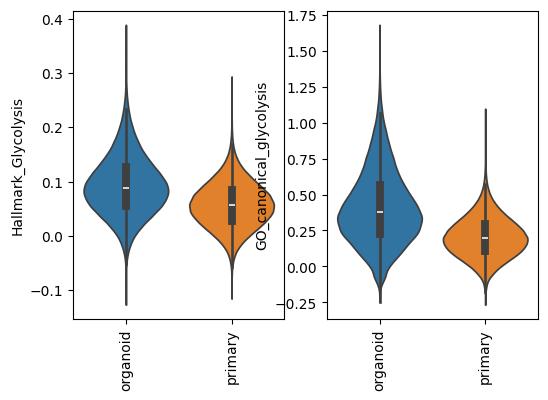

In [72]:
fig, ax = plt.subplots(1,2, figsize=(6,4))
sc.pl.violin(adata_n, ax=ax[0], keys='Hallmark_Glycolysis', groupby='dataset', rotation=90, log=False, stripplot=False, inner='box', show=False)
sc.pl.violin(adata_n, ax=ax[1], keys='GO_canonical_glycolysis', groupby='dataset', rotation=90, log=False, stripplot=False, inner='box', show=False)
fig.show()

In [77]:
subtypes = np.intersect1d(np.unique(adata_n.obs['annot_level_4_rev2'][adata_n.obs['dataset']=='organoid']),
                          np.unique(adata_n.obs['annot_level_4_rev2'][adata_n.obs['dataset']=='primary']))
glycolysis_scores = np.array([ [ np.mean(adata_n.obs['GO_canonical_glycolysis'][(adata_n.obs['annot_level_4_rev2']==subtype) & (adata_n.obs['publication_protocol']==ds)]) if np.sum((adata_n.obs['annot_level_4_rev2']==subtype) & (adata_n.obs['publication_protocol']==ds))>20 else np.nan for ds in adata_n.obs['publication_protocol'].cat.categories ] for subtype in subtypes ])
glycolysis_scores.shape

(8, 37)

In [78]:
hallmark_glycolysis_scores = np.array([ [ np.mean(adata_n.obs['Hallmark_Glycolysis'][(adata_n.obs['annot_level_4_rev2']==subtype) & (adata_n.obs['publication_protocol']==ds)]) if np.sum((adata_n.obs['annot_level_4_rev2']==subtype) & (adata_n.obs['publication_protocol']==ds))>20 else np.nan for ds in adata_n.obs['publication_protocol'].cat.categories ] for subtype in subtypes ])
hallmark_glycolysis_scores.shape

(8, 37)

In [99]:
electron_transport = pd.read_csv('/links/groups/treutlein/USERS/zhisong_he/Work/databases/GeneLists/GO_mitochodrial_ATP_synthesis_coupled_electron_transport.txt', sep='\t', header=None, index_col=None).iloc[:,1]
electron_transport = np.intersect1d(electron_transport, adata_n.var_names)

In [101]:
sc.tl.score_genes(adata_n, electron_transport, score_name='Electron_Transport')
electron_scores = np.array([ [ np.mean(adata_n.obs['Electron_Transport'][(adata_n.obs['annot_level_4_rev2']==subtype) & (adata_n.obs['publication_protocol']==ds)]) if np.sum((adata_n.obs['annot_level_4_rev2']==subtype) & (adata_n.obs['publication_protocol']==ds))>20 else np.nan for ds in adata_n.obs['publication_protocol'].cat.categories ] for subtype in subtypes ])
electron_scores.shape

(8, 37)

In [102]:
df = pd.DataFrame({'canonical' : glycolysis_scores.flatten(),
                   'hallmark' :hallmark_glycolysis_scores.flatten(),
                   'electron' : electron_scores.flatten(),
                   'subtype' : np.repeat(subtypes, len(adata_n.obs['publication_protocol'].cat.categories)),
                   'dataset' : np.tile(adata_n.obs['publication_protocol'].cat.categories, len(subtypes))
                  })
df['datatype'] = [ 'primary' if x.endswith('primary') else 'organoid' for x in df['dataset'] ]
df.head()

,canonical,hallmark,electron,subtype,dataset,datatype
0,0.281289,0.059009,0.556813,Medulla Neuron NT-CHOL,"Andersen, 2020: Andersen, 2020 (doi: 10.1016/j...",organoid
1,0.332617,0.068471,0.437241,Medulla Neuron NT-CHOL,"Andersen, 2020: Andersen, 2020 (doi: 10.1016/j...",organoid
2,NaN,NaN,NaN,Medulla Neuron NT-CHOL,"Bhaduri, 2020: Bhaduri, 2020 (doi: 10.1038/s41...",organoid
3,0.632572,0.122645,0.744295,Medulla Neuron NT-CHOL,"Bhaduri, 2020: Bhaduri, 2020 (doi: 10.1038/s41...",organoid
4,0.480004,0.101310,0.828530,Medulla Neuron NT-CHOL,"Bhaduri, 2020: Velasco, 2019 (doi: 10.1038/s41...",organoid


/local1/scratch/hezhi/temp/ipykernel_24731/1786429807.py:7: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


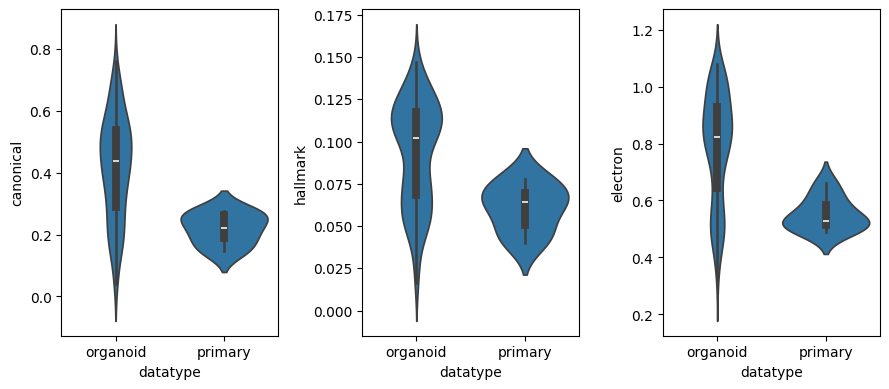

In [103]:
import seaborn as sm
fig, ax = plt.subplots(1,3, figsize=(9,4))
sm.violinplot(df, ax=ax[0], x='datatype', y='canonical')
sm.violinplot(df, ax=ax[1], x='datatype', y='hallmark')
sm.violinplot(df, ax=ax[2], x='datatype', y='electron')
fig.tight_layout()
fig.show()

In [104]:
from scipy.stats import ranksums
idx = ~np.isnan(df['canonical'])
[ ranksums(df['canonical'][(df['datatype']=='primary') & idx], df['canonical'][(df['datatype']=='organoid') & idx]),
  ranksums(df['hallmark'][(df['datatype']=='primary') & idx], df['hallmark'][(df['datatype']=='organoid') & idx]),
  ranksums(df['electron'][(df['datatype']=='primary') & idx], df['electron'][(df['datatype']=='organoid') & idx])
]

[RanksumsResult(statistic=-3.331353692996392, pvalue=0.0008642471693787074),
 RanksumsResult(statistic=-2.8279491349436037, pvalue=0.004684724935665534),
 RanksumsResult(statistic=-3.101860438589974, pvalue=0.0019230859860271125)]

In [113]:
meta = pd.read_csv('data/phase3_final_0516/DE_240528/obs_stress_scores_revision.tsv.gz', sep='\t', index_col=0)
meta['datatype'] = [ 'primary' if x.endswith('primary') else 'organoid' for x in meta['publication_protocol'] ]
meta.head()

,assay_sc,assay_differentiation,assay_type_differentiation,cell_line,suspension_type,organoid_age_days,publication,batch,n_genes,neuron_subtype,publication_protocol,canonical_glycolysis_score,mitochondrial_ATP_synthesis_coupled_electron_transport_score,hallmark_glycolysis_score,datatype
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_72,BD Rhapsody Whole Transcriptome Analysis,"Andersen, 2020 (doi: 10.1016/j.cell.2020.11.017)",guided,custom_8858-1,cell,45.0,"Andersen, 2020",homosapiens_hindbrain_2020_bdrhapsodywholetran...,1908,Medulla Neuron NT-GABA,"Andersen, 2020_Andersen, 2020 (doi: 10.1016/j....",2.643139,1.919623,0.351820,organoid
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_79,BD Rhapsody Whole Transcriptome Analysis,"Andersen, 2020 (doi: 10.1016/j.cell.2020.11.017)",guided,custom_8858-1,cell,45.0,"Andersen, 2020",homosapiens_hindbrain_2020_bdrhapsodywholetran...,1858,Pons Neuron NT-VGLUT,"Andersen, 2020_Andersen, 2020 (doi: 10.1016/j....",2.207433,1.990439,0.102381,organoid
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_83,BD Rhapsody Whole Transcriptome Analysis,"Andersen, 2020 (doi: 10.1016/j.cell.2020.11.017)",guided,custom_8858-1,cell,45.0,"Andersen, 2020",homosapiens_hindbrain_2020_bdrhapsodywholetran...,1917,Medulla Neuron NT-VGLUT,"Andersen, 2020_Andersen, 2020 (doi: 10.1016/j....",1.610859,2.206439,0.430419,organoid
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_85,BD Rhapsody Whole Transcriptome Analysis,"Andersen, 2020 (doi: 10.1016/j.cell.2020.11.017)",guided,custom_8858-1,cell,45.0,"Andersen, 2020",homosapiens_hindbrain_2020_bdrhapsodywholetran...,1789,Medulla Neuron NT-VGLUT,"Andersen, 2020_Andersen, 2020 (doi: 10.1016/j....",1.768461,2.440248,0.282850,organoid
homosapiens_hindbrain_2020_bdrhapsodywholetranscriptomeanalysis_andersenjimena_001_d10_1016_j_cell_2020_11_017_86,BD Rhapsody Whole Transcriptome Analysis,"Andersen, 2020 (doi: 10.1016/j.cell.2020.11.017)",guided,custom_8858-1,cell,45.0,"Andersen, 2020",homosapiens_hindbrain_2020_bdrhapsodywholetran...,1891,Pons Neuron NT-SER,"Andersen, 2020_Andersen, 2020 (doi: 10.1016/j....",3.252078,2.265746,0.527603,organoid


In [120]:
subtypes = np.intersect1d(np.unique(meta['neuron_subtype'][meta['datatype']=='organoid']),
                          np.unique(meta['neuron_subtype'][meta['datatype']=='primary']))
glycolysis_scores = np.array([ [ np.mean(meta['canonical_glycolysis_score'][(meta['neuron_subtype']==subtype) & (meta['publication_protocol']==ds)]) if np.sum((meta['neuron_subtype']==subtype) & (meta['publication_protocol']==ds))>20 else np.nan for ds in np.unique(meta['publication_protocol']) ] for subtype in subtypes ])
hallmark_glycolysis_scores = np.array([ [ np.mean(meta['hallmark_glycolysis_score'][(meta['neuron_subtype']==subtype) & (meta['publication_protocol']==ds)]) if np.sum((meta['neuron_subtype']==subtype) & (meta['publication_protocol']==ds))>20 else np.nan for ds in np.unique(meta['publication_protocol']) ] for subtype in subtypes ])
electron_scores = np.array([ [ np.mean(meta['mitochondrial_ATP_synthesis_coupled_electron_transport_score'][(meta['neuron_subtype']==subtype) & (meta['publication_protocol']==ds)]) if np.sum((meta['neuron_subtype']==subtype) & (meta['publication_protocol']==ds))>20 else np.nan for ds in np.unique(meta['publication_protocol']) ] for subtype in subtypes ])

In [121]:
df = pd.DataFrame({'canonical' : glycolysis_scores.flatten(),
                   'hallmark' :hallmark_glycolysis_scores.flatten(),
                   'electron' : electron_scores.flatten(),
                   'subtype' : np.repeat(subtypes, len(np.unique(meta['publication_protocol']))),
                   'dataset' : np.tile(np.unique(meta['publication_protocol']), len(subtypes))
                  })
df['datatype'] = [ 'primary' if x.endswith('primary') else 'organoid' for x in df['dataset'] ]
df.head()

,canonical,hallmark,electron,subtype,dataset,datatype
0,NaN,NaN,NaN,Cerebellar Neuron NT-GABA,"Andersen, 2020_Andersen, 2020 (doi: 10.1016/j....",organoid
1,1.326883,0.177543,0.642572,Cerebellar Neuron NT-GABA,"Andersen, 2020_Andersen, 2020 (doi: 10.1016/j....",organoid
2,1.520799,0.347656,3.278442,Cerebellar Neuron NT-GABA,"Bhaduri, 2020_Bhaduri, 2020 (doi: 10.1038/s415...",organoid
3,1.827360,0.352209,2.401469,Cerebellar Neuron NT-GABA,"Bhaduri, 2020_Bhaduri, 2020 (doi: 10.1038/s415...",organoid
4,1.646465,0.320978,2.627903,Cerebellar Neuron NT-GABA,"Bhaduri, 2020_Velasco, 2019 (doi: 10.1038/s415...",organoid


/local1/scratch/hezhi/temp/ipykernel_24731/1786429807.py:7: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


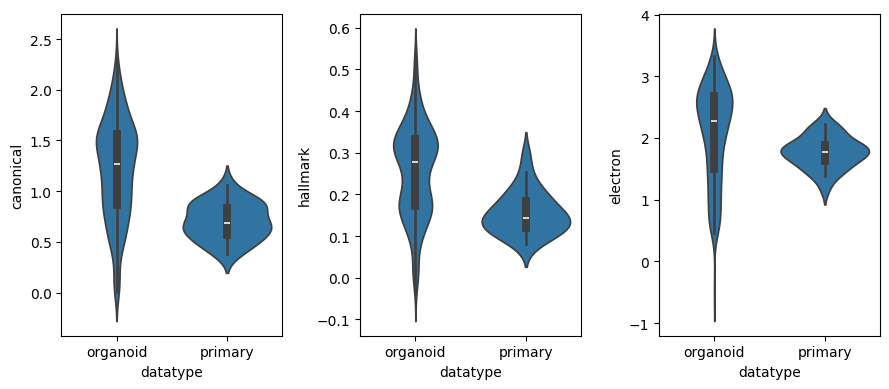

In [122]:
import seaborn as sm
fig, ax = plt.subplots(1,3, figsize=(9,4))
sm.violinplot(df, ax=ax[0], x='datatype', y='canonical')
sm.violinplot(df, ax=ax[1], x='datatype', y='hallmark')
sm.violinplot(df, ax=ax[2], x='datatype', y='electron')
fig.tight_layout()
fig.show()

In [123]:
from scipy.stats import ranksums
idx = ~np.isnan(df['canonical'])
[ ranksums(df['canonical'][(df['datatype']=='primary') & idx], df['canonical'][(df['datatype']=='organoid') & idx]),
  ranksums(df['hallmark'][(df['datatype']=='primary') & idx], df['hallmark'][(df['datatype']=='organoid') & idx]),
  ranksums(df['electron'][(df['datatype']=='primary') & idx], df['electron'][(df['datatype']=='organoid') & idx])
]

[RanksumsResult(statistic=-5.583382203118289, pvalue=2.3588556794440623e-08),
 RanksumsResult(statistic=-5.013679445940477, pvalue=5.339891998972913e-07),
 RanksumsResult(statistic=-3.2248718249572987, pvalue=0.0012602908012085954)]